preprocessing:
1. exlude invalid data (what are the criteria to use)
2. fixation/saccade detection + merging and exluding
3. cohen's correction
4. exclude the tailing fixation

Sanity checks before and after preprocessing
00. reading time (note: TIME logged is not refreshed until the Gazepoint is re-initialized)
0. events plotting
1. x, y plot overtime
2. check for valid data
3. fixation/saccade plotting (x,y overtime, main sequence, fixation distribution)
4. gaze-text overlay (gaze plot with fixation)

Analysis plotting (table and bar charts)
1. fixation time on AOI
2. go past analysis
3. regression in & out

Notes:
- subject 7 trial 10 is invalid
- should probably use automated blink detection instead: https://pymovements.readthedocs.io/en/stable/tutorials/blink-detection.html
- maybe test the fixation detection using some eyelink dataset
- remember to change the time relative to recording start
- whether to use new blink detection or not
- maybe consider smooth out the jitters using a low pass filter (???)
- whether to interpolate the blinks (iinvalid data) or not
- consider using I2MC, which is more robust to noises: https://github.com/dcnieho/I2MC_Python
- should probbaly prioritize fixation (but if its velocity based, do we first inspect the saccaddes, mark them as fixations, and then merge and clean them)
- plot the reading time too probably


Reference links:
- tutorial: https://arxiv.org/html/2404.15435v1#S4
- gazepoint documentation (need to check for updates): https://www.gazept.com/dl/Gazepoint_API_v2.0.pdf
- how to merge and select fixation candidates: https://link.springer.com/article/10.3758/s13428-021-01723-1
- range of reading fixations & ratio between fixation and saccades (5:1?): Eye movements in reading and information processing: 20 years of research
- cohen's correction
- wrap-up effects in reading (also in 20 years of research): Rayner, K., Kambe, G., & Duffy, S. A. (2000). "The effect of clause wrap-up on eye movements during reading. 
- accuracy and precision on the fixation cross: Accuracy and precision of fixation locations recorded with the low-cost Eye Tribe tracker in different experimental set-ups
- visualize blinking: https://pymovements.readthedocs.io/en/stable/tutorials/blink-cleaning.html
- old source of which font opensesame uses exactly: https://osdoc.cogsci.nl/2.9.1/usage/text/

In [858]:
import numpy as np
import pandas as pd
import scipy
import math
import os.path as path
import re
import sys, types
import string
import yaml

import seaborn as sns
import matplotlib.pyplot as plt
from matplotlib.patches import Rectangle
from matplotlib.collections import LineCollection
from matplotlib.colors import LinearSegmentedColormap
from matplotlib.colors import Normalize
import matplotlib.patheffects as pe

from scipy.optimize import minimize
from scipy.stats import norm
from scipy.special import logsumexp

import remodnav
import pymovements as pm
from I2MC import I2MC

from PIL import ImageFont
import matplotlib.font_manager as fm
from matplotlib import font_manager

import eyekit
from eyekit import TextBlock
from eyekit.fixation import Fixation, FixationSequence
import eyekit.vis as vis



In [859]:
%load_ext autoreload
%autoreload 2
from src.cleaning import cleaning
from src.visualization import plot_events, plot_gaze_across_time

from subject_info import SUBJECT_INFO
import config

The autoreload extension is already loaded. To reload it, use:
  %reload_ext autoreload


In [698]:
## install the required packages if not already installed
# !pip install remodnav numpy scipy pandas matplotlib -q
# !pip install --no-deps git+https://github.com/DiGyt/cateyes.git -q

# all the stupid things to bypass the cateyes dependency on nslr_hmm, which is not compatible here (and we dont use NSLR-HMM mmethod anyways)
nslr_stub = types.ModuleType('nslr_hmm')
nslr_stub.FIXATION = 1
nslr_stub.SACCADE = 2
nslr_stub.PSO = 3
nslr_stub.SMOOTH_PURSUIT = 4
sys.modules['nslr_hmm'] = nslr_stub
sys.modules['nslr'] = types.ModuleType('nslr')

from cateyes import classify_velocity, classify_dispersion, classify_remodnav, classify_uneye, pixel_to_degree, continuous_to_discrete, discrete_to_continuous, plot_segmentation, plot_trajectory

In [ ]:
# load the data
datapath = '../data/raw'
SUBJECT = 1
LIST: Unknown = SUBJECT_INFO[f'subj{SUBJECT}']['list']
EXCLUSION = SUBJECT_INFO[f'subj{SUBJECT}']['exclude']  #NOTE: lets deal with this later
events_data = pd.read_csv(path.join(datapath, f'subject-{SUBJECT}.csv'), sep=',', header=0)
et_data = pd.read_csv(path.join(datapath, f'subject-{SUBJECT}.tsv'), sep='\t', header=0)

In [700]:
# meta data
RESOLUTION = [1920, 1080] 
SCREEN_SIZE = [59.69, 34.29]  # cm (27 inches screen (23.5, 13.5), 16:9 aspect ratio)
SMPL_RATE = 150 # Hz (the log file shows 60Hz but is incorrect)
DISTANCE = 60 # cm

In [701]:
events_data.head(5)

,AN,Code,RN,acc,accuracy,an_found,an_height,an_line,an_text,an_width,...,title,total_correct,total_response_time,total_responses,trial_counter,width,word,word_height,word_spacing,word_width
0,<AN>Männer</AN>,C3,<RN>Studentinnen</RN>,undefined,undefined,NaN,NaN,NaN,NaN,NaN,...,Experiment,0,0,0,0,1920,NaN,NaN,NaN,NaN
1,<AN>Frauen</AN>,C4,<RN>Krankenschwestern</RN>,undefined,undefined,True,53.0,4.0,<AN>Frauen</AN>,132.0,...,Experiment,0,0,0,1,1920,diskutiert.,53.0,25.0,243.0
2,<AN>Frauen</AN>,C2,<RN>Ingenieure</RN>,undefined,undefined,True,53.0,4.0,<AN>Frauen</AN>,132.0,...,Experiment,0,0,0,1,1920,diskutiert.,53.0,25.0,243.0
3,<AN>Männer</AN>,C3,<RN>Arbeitnehmerinnen</RN>,undefined,undefined,True,53.0,4.0,<AN>Frauen</AN>,132.0,...,Experiment,0,0,0,1,1920,diskutiert.,53.0,25.0,243.0
4,<AN>Männer</AN>,C3,<RN>Krankenschwestern</RN>,undefined,undefined,True,53.0,4.0,<AN>Frauen</AN>,132.0,...,Experiment,0,0,0,1,1920,diskutiert.,53.0,25.0,243.0


In [702]:
# correct for the time of the recording (TBD)

In [703]:
events_data_selected = events_data[events_data['list'] == LIST].reset_index(drop=True)
print(events_data_selected)

                  AN Code                           RN        acc   accuracy  \
0    <AN>Frauen</AN>   C4   <RN>Krankenschwestern</RN>  undefined  undefined   
1    <AN>Frauen</AN>   C2             <RN>Pfleger</RN>  undefined  undefined   
2    <AN>Frauen</AN>   C2            <RN>Experten</RN>  undefined  undefined   
3    <AN>Frauen</AN>   C2           <RN>Einwohner</RN>  undefined  undefined   
4    <AN>Männer</AN>   C5  <RN>Arbeitnehmer*innen</RN>  undefined  undefined   
5    <AN>Frauen</AN>   C6      <RN>Polizist*innen</RN>  undefined  undefined   
6    <AN>Frauen</AN>   C4    <RN>Unternehmerinnen</RN>  undefined  undefined   
7    <AN>Männer</AN>   C5     <RN>Ingenieur*innen</RN>  undefined  undefined   
8   <AN>Männern</AN>   C1           <RN>Einwohner</RN>  undefined  undefined   
9    <AN>Männer</AN>   C1            <RN>Experten</RN>  undefined  undefined   
10   <AN>Männer</AN>   C5      <RN>Aktivist*innen</RN>  undefined  undefined   
11   <AN>Männer</AN>   C3         <RN>Do

In [704]:
events_data_selected['display_sentence'].iloc[10]

'Auf einer öffentlichen Veranstaltung werden aktuelle wohnungs- und gesellschaftspolitische Themen diskutiert. Die <RN>Aktivist*innen</RN> fordern mehr bezahlbaren Wohnraum in Stuttgart und diskutieren faire Lösungsansätze, doch diese <AN>Männer</AN> sehen die Verantwortung stärker beim Bund. Die Auswirkungen der Entscheidung werden noch geprüft.'

In [705]:
# plot for gaze across time
# NOTE: tbd - change axis to key used in the df.
def plot_gaze_across_time(data, axis, bar=True, note=""):
    plt.figure(figsize=(15,5))

    BPOG = "BPOGX" if axis == "X" else "BPOGY"

    plt.plot(
        data["TIME"],
        data[BPOG],
        linewidth=0.5
    )
    y_max = plt.ylim()[1]

    # plot for the vertical lines for each event in the events_data_selected dataframe
    if bar:
        i = 0
        for _, row in data.iterrows():
            if row["USER"] == 'FIXATION_ONSET':
                i += 1
                plt.axvline(
                    row["TIME"],
                    alpha=0.2,
                    linestyle="--"
                )
                plt.text(x=row["TIME"], y=y_max*0.8, s=f'trial {i}', alpha=0.2, rotation=90)

    plt.xlabel("Time (s)")
    plt.ylabel(f"{axis} Position")
    plt.title(f"Time vs. {axis}-Position for subject {SUBJECT} {note}")

    plt.show()

    # place to save the plot


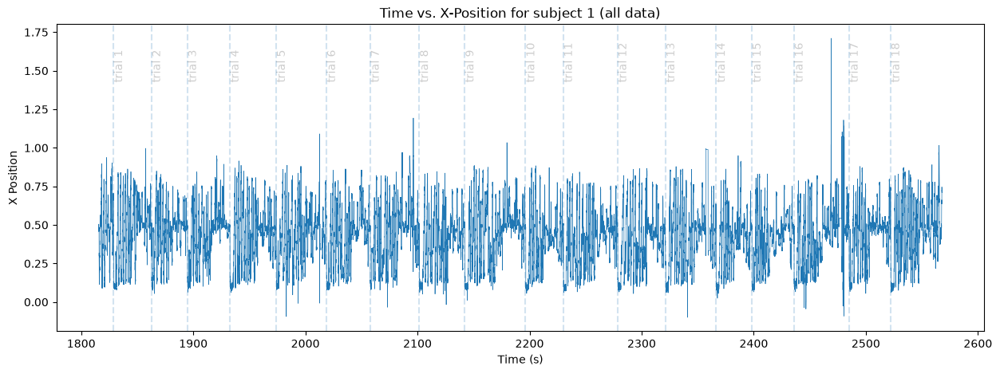

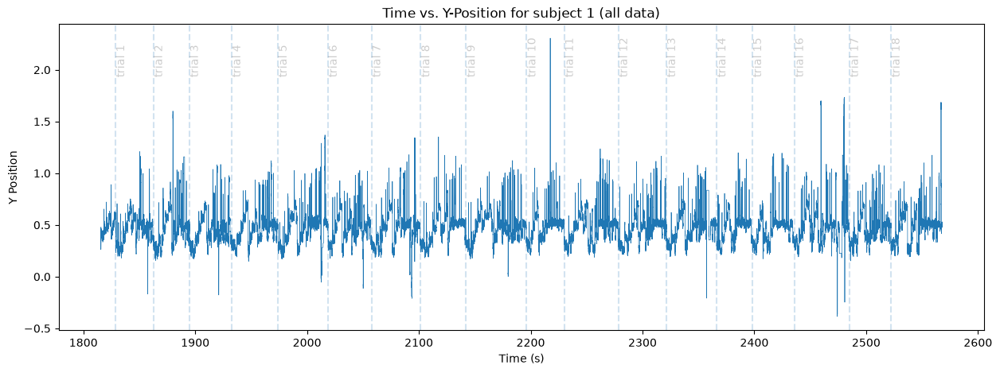

In [706]:
plot_gaze_across_time(et_data, axis="X", bar=True, note="(all data)")
plot_gaze_across_time(et_data, axis="Y", bar=True, note="(all data)")

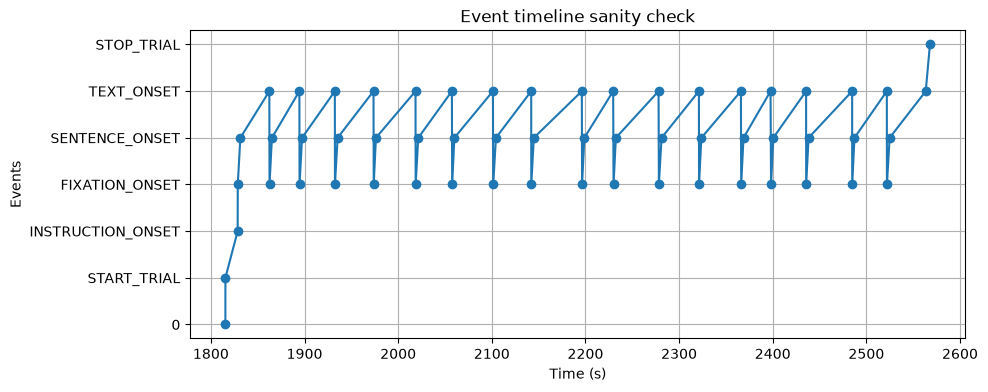

In [707]:
logs = et_data[
    et_data["USER"].notna()
].copy()
plt.figure(figsize=(10,4))

plt.plot(logs["TIME"], logs["USER"], marker="o")

plt.title("Event timeline sanity check")
plt.xlabel("Time (s)")
plt.ylabel("Events")

plt.grid(True)

plt.show()

## exclude invalid data

In [708]:
# turn the invalid data points into NaN
# why not just drop: to preserve the sampling rate, safer interpolation, etc.
# NOTE: tbd - how to determine for the threshold etc. & should we interpolate?
base_invalid = (
    (et_data['BPOGV'] != 1) |
    (et_data['BPOGX'] < 0) | (et_data['BPOGX'] > 1) |
    (et_data['BPOGY'] < 0) | (et_data['BPOGY'] > 1)
)
padded_invalid = base_invalid.rolling(window=13, center=True, min_periods=1).max().astype(bool)     #remove those next to the invalid data
et_data.loc[padded_invalid, ['BPOGX', 'BPOGY']] = np.nan


print(f"The percentage of invalid data is {(sum(np.isnan(et_data['BPOGX'].values))/len(et_data['BPOGX'])):.2%}")

The percentage of invalid data is 9.91%


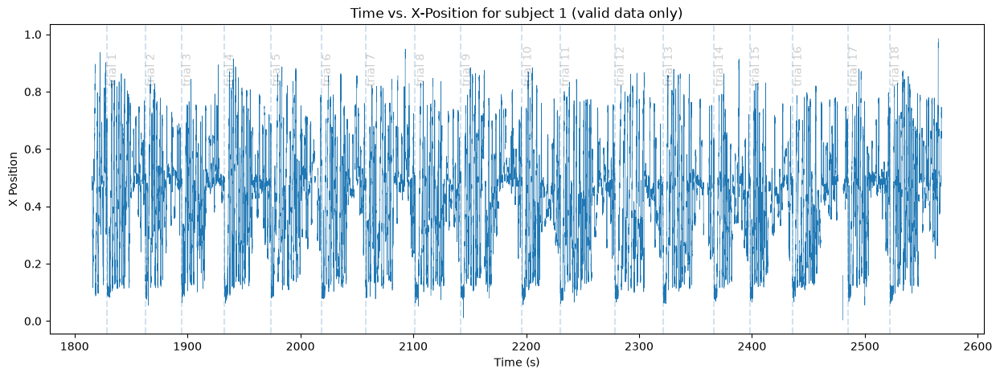

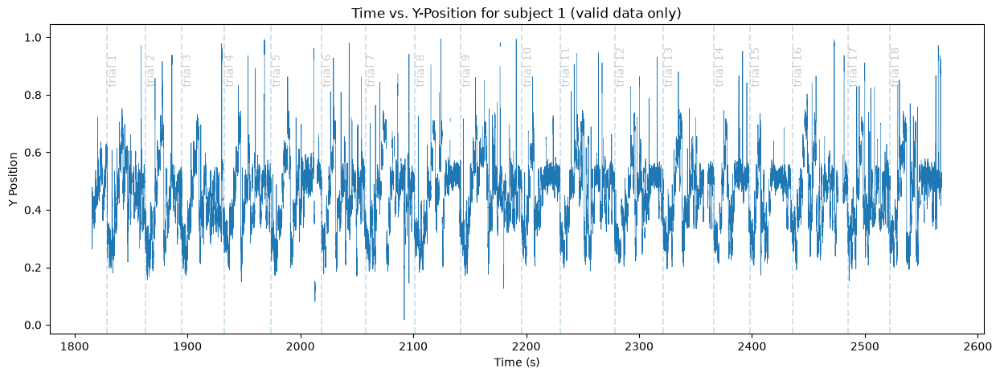

In [709]:
plot_gaze_across_time(et_data, axis="X", bar=True, note="(valid data only)")
plot_gaze_across_time(et_data, axis="Y", bar=True, note="(valid data only)")

## gaze unit conversion

In [710]:
# convert the normalized coordinates to pixel coordinates
et_data['X_px'] = et_data['BPOGX'] * RESOLUTION[0]
et_data['Y_px'] = et_data['BPOGY'] * RESOLUTION[1]

# center the coordinates at the mid of the screen (0,0)
et_data['X_px_center'] = et_data['BPOGX'] * RESOLUTION[0] - RESOLUTION[0] / 2
et_data['Y_px_center'] = et_data['BPOGY'] * RESOLUTION[1] - RESOLUTION[1] / 2

#convert pixel coordinates to visual degrees
gaze_px = np.vstack([et_data['X_px'].values,
                     et_data['Y_px'].values])          # shape (2, n_samples)
deg = pixel_to_degree(gaze_px, DISTANCE, SCREEN_SIZE, RESOLUTION)  # SCREEN_SIZE, RESOLUTION stay length-2
et_data['X_deg'] = deg[0]
et_data['Y_deg'] = deg[1]


In [711]:
print(et_data['X_px'].describe())

count    101196.000000
mean        823.036823
std         364.130584
min           7.238400
25%         540.019200
50%         868.089600
75%        1050.936000
max        1891.641600
Name: X_px, dtype: float64


In [712]:
print(et_data['X_px_center'].describe())

count    101196.000000
mean       -136.963177
std         364.130584
min        -952.761600
25%        -419.980800
50%         -91.910400
75%          90.936000
max         931.641600
Name: X_px_center, dtype: float64


In [713]:
print(et_data['X_deg'].describe())

count    101196.000000
mean         -3.929051
std          10.487198
min         -26.273994
25%         -12.276730
50%          -2.726518
75%           2.697656
max          25.767671
Name: X_deg, dtype: float64


## Fixation Detection
- remember to calculate the percentage, add more plots etc.

In [714]:
# fixation detection
## wanted to use this one but the sampling rate is too low? need to check
# segments, classes, events = classify_remodnav(sentence_data['X_deg'].values, sentence_data['Y_deg'].values, sentence_data['TIME'].values, 1)
# threshold = 2.5, window = 1
fixation_method = 'I-DT'
if fixation_method == 'I-DT':
    segments, classes = classify_dispersion(et_data['X_deg'].values, et_data['Y_deg'].values, et_data['TIME'].values, 2.5, 0.08)
elif fixation_method == 'I-VT':
    segments, classes = classify_velocity(et_data['X_deg'].values, et_data['Y_deg'].values, et_data['TIME'].values)
elif fixation_method == 'remodnav':
    segments, classes, events = classify_remodnav(et_data['X_deg'].values, et_data['Y_deg'].values, et_data['TIME'].values, 1)  
elif fixation_method == 'uneye':
    # dont think this is a suitable method as its trained on 1000Hz data i think. would need to retrain but for which we need ground truth
    segments, classes = classify_uneye(et_data['X_deg'].values, et_data['Y_deg'].values, et_data['TIME'].values, 3, 1)  
et_data['segments'] = segments
et_data['classes'] = classes
et_data['classes_clean'] = classes

/opt/homebrew/Caskroom/miniconda/base/envs/eyetrack/lib/python3.12/site-packages/cateyes/utils.py:365: UserWarning: 

Irregular sampling rate detected. This can lead to impaired performance with this classifier. Consider resampling your data to a fixed sampling rate. Setting sampling rate to average sample difference.
  warnings.warn(WARN_SFREQ)


In [715]:
et_data.head(5)

,CNT,TIME,TIME_TICK,FPOGX,FPOGY,FPOGS,FPOGD,FPOGID,FPOGV,LPOGX,...,USER,X_px,Y_px,X_px_center,Y_px_center,X_deg,Y_deg,segments,classes,classes_clean
0,270543,1815.46558,82345391121,0.43718,0.30269,1815.11719,0.34839,1127,1,0.48606,...,0,907.8144,423.9648,-52.1856,-116.0352,-1.548876,-3.513662,0,Saccade,Saccade
1,270544,1815.47205,82345455692,0.44931,0.33064,1815.11719,0.34839,1127,0,0.50780,...,START_TRIAL,952.8000,479.3364,-7.2000,-60.6636,-0.213748,-1.838629,0,Saccade,Saccade
2,270545,1815.47839,82345519685,0.47156,0.37186,1815.11719,0.34839,1127,0,0.49102,...,NaN,948.1152,446.1264,-11.8848,-93.8736,-0.352824,-2.843818,0,Saccade,Saccade
3,270546,1815.48572,82345593122,0.47887,0.38195,1815.11719,0.34839,1127,0,0.49026,...,NaN,947.5008,434.3112,-12.4992,-105.6888,-0.371063,-3.201046,0,Saccade,Saccade
4,270547,1815.49243,82345659405,0.47994,0.38457,1815.47205,0.02039,1128,1,0.49954,...,NaN,927.6672,423.8244,-32.3328,-116.1756,-0.959786,-3.517903,0,Saccade,Saccade


In [716]:
def plot_chunk_classification(data, window, segments_col, classes_col):
    min_time, max_time = window
    chunk_df = data[(data['TIME'] >= min_time) & (data['TIME'] <= max_time)].copy()

    fig, (ax1, ax2) = plt.subplots(2, 1, figsize=(20, 10), sharex=True)

    discrete_segments = continuous_to_discrete(chunk_df['TIME'].values, chunk_df[segments_col].values, chunk_df[classes_col].values)    #segment based instead of sample based for better illustration

    # gaze x
    plot_segmentation(
        chunk_df['X_deg'].values, 
        chunk_df['TIME'].values, 
        segments=discrete_segments, 
        ax=ax1
    )
    ax1.set_ylabel("X (deg)")

    # gaze y
    plot_segmentation(
        chunk_df['Y_deg'].values, 
        chunk_df['TIME'].values, 
        segments=discrete_segments, 
        ax=ax2
    )
    ax2.set_ylabel("Y (deg)")
    ax2.set_xlabel("time (s)")

    ax1.set_title(f'Saccade Detection based on {fixation_method}')
    plt.show()

In [717]:
#NOTE: under construction. probably missed some condition, and thats why saccades in I2MC is missing after cleaning and merging
#NOTE: also need to exclude the fixations that are too long (>1200ms?). not sure if i should do it here tho
def fixation_merge_clean(data, in_cols, out_cols, criteria=(1.0, 80, 600)):
    '''
    params:
    - data: the input et data dataframe
    - in_cols: a tuple of strings (class, segment). the column names of the fixation data to be processed
    - out_cols: a tuple of strings (class, segment) the column names of the output data to be stored
    - criteria: a dictionary containing the merge and drop criteria (
    'merge_degree_gap', 'min_duration')
    '''
    ori_classes, ori_segments = in_cols
    new_classes, new_segments = out_cols
    merge_degree_gap, min_duration, max_duration= criteria

    current_start_t = None
    current_end_t = None
    last_x = None
    last_y = None

    valid_fixation_blocks = [] 

    fixations = data[data[ori_classes] == 'Fixation']
    fixation_groups = [group for _, group in fixations.groupby(ori_segments)]
    for group in fixation_groups:
        group_start = group['TIME'].iloc[0]
        group_end = group['TIME'].iloc[-1]
        
        group_start_x = group['X_deg'].iloc[0] 
        group_start_y = group['Y_deg'].iloc[0]
        group_end_x = group['X_deg'].iloc[-1]
        group_end_y = group['Y_deg'].iloc[-1]
        
        if current_start_t is None:
            current_start_t = group_start
            current_end_t = group_end
            last_x = group_end_x
            last_y = group_end_y
            continue
            
        time_gap_ms = (group_start - current_end_t) * 1000
        spatial_gap_deg = np.sqrt((group_start_x - last_x)**2 + (group_start_y - last_y)**2)
        
        # Tmin = 2.2 * Amin + 27
        merge_time_gap = 2.2 * merge_degree_gap + 27  # see reference: fixation classification: how to merge and select fixation candidates
        if time_gap_ms < merge_time_gap and spatial_gap_deg < merge_degree_gap:
            current_end_t = group_end       
            last_x = group_end_x          
            last_y = group_end_y
        else:
            # DROP CONDITION: Must be >= 80ms to be a valid human fixation
            duration = (current_end_t - current_start_t) * 1000 + (1000 / SMPL_RATE)
            if duration >= min_duration and duration <= max_duration: 
                valid_fixation_blocks.append((current_start_t, current_end_t))
                
            # Reset trackers for the next block
            current_start_t = group_start
            current_end_t = group_end
            last_x = group_end_x
            last_y = group_end_y
            
    # Check the very last fixation block
    if current_start_t is not None:
        duration = (current_end_t - current_start_t) * 1000 + (1000 / 150)
        if duration >= min_duration and duration <= max_duration:
            valid_fixation_blocks.append((current_start_t, current_end_t))

    print(f"Total Valid Fixations Found: {len(valid_fixation_blocks)}")

    # Demote all old, noisy fixations to 'Unclassified'
    data.loc[data[ori_classes] == 'Fixation', new_classes] = 'Saccade' #NOTE: not sure whether to put saccade or None here

    # Promote our validated blocks back to 'Fixation' 
    for start_t, end_t in valid_fixation_blocks:
        mask = (data['TIME'] >= start_t) & (data['TIME'] <= end_t)
        data.loc[mask, new_classes] = 'Fixation'

    # Create fresh contiguous segment IDs so the plotting function can group them properly
    data[new_segments] = (data[new_classes] != data[new_classes].shift()).cumsum()

In [718]:
fixation_merge_clean(et_data, ('classes', 'segments'), ('classes_clean', 'segments_clean'))
et_data.head(5)

Total Valid Fixations Found: 2777


,CNT,TIME,TIME_TICK,FPOGX,FPOGY,FPOGS,FPOGD,FPOGID,FPOGV,LPOGX,...,X_px,Y_px,X_px_center,Y_px_center,X_deg,Y_deg,segments,classes,classes_clean,segments_clean
0,270543,1815.46558,82345391121,0.43718,0.30269,1815.11719,0.34839,1127,1,0.48606,...,907.8144,423.9648,-52.1856,-116.0352,-1.548876,-3.513662,0,Saccade,Saccade,1
1,270544,1815.47205,82345455692,0.44931,0.33064,1815.11719,0.34839,1127,0,0.50780,...,952.8000,479.3364,-7.2000,-60.6636,-0.213748,-1.838629,0,Saccade,Saccade,1
2,270545,1815.47839,82345519685,0.47156,0.37186,1815.11719,0.34839,1127,0,0.49102,...,948.1152,446.1264,-11.8848,-93.8736,-0.352824,-2.843818,0,Saccade,Saccade,1
3,270546,1815.48572,82345593122,0.47887,0.38195,1815.11719,0.34839,1127,0,0.49026,...,947.5008,434.3112,-12.4992,-105.6888,-0.371063,-3.201046,0,Saccade,Saccade,1
4,270547,1815.49243,82345659405,0.47994,0.38457,1815.47205,0.02039,1128,1,0.49954,...,927.6672,423.8244,-32.3328,-116.1756,-0.959786,-3.517903,0,Saccade,Saccade,1


In [719]:
# plotting
def plot_fixation_distribution(data, class_label, segment_label):
    fixations = data[data[class_label] == 'Fixation']
    fix_groups = [group for _, group in fixations.groupby(segment_label)]

    durations = [(group['TIME'].iloc[-1] - group['TIME'].iloc[0]) * 1000 + (1000 / SMPL_RATE) for group in fix_groups]

    plt.figure(figsize=(8, 5))
    plt.hist(durations, bins=30, range=(0, 600))
        
    plt.title(f"Distribution of Fixation Duration by {fixation_method} (Merged & Cleaned)")   #NOTE: remember to change the title
    plt.xlabel("Time (ms)")
    plt.ylabel("Count")
    plt.tight_layout()
    plt.show()

Classes unique values: classes
Fixation    69991
Saccade     42341
Name: count, dtype: int64


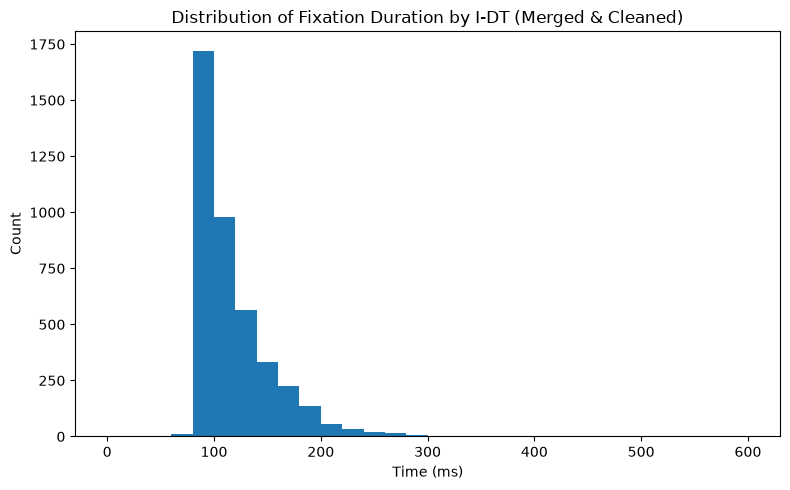

Classes clean unique values: classes_clean
Fixation    68210
Saccade     44122
Name: count, dtype: int64


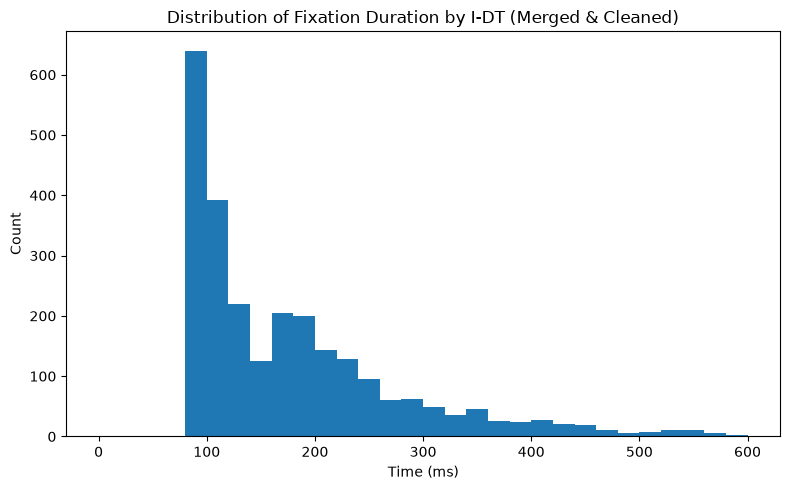

In [720]:
print("Classes unique values:", et_data['classes'].value_counts())
plot_fixation_distribution(et_data, class_label='classes', segment_label='segments')

print("Classes clean unique values:", et_data['classes_clean'].value_counts())
plot_fixation_distribution(et_data, class_label='classes_clean', segment_label='segments_clean')

In [721]:
def saccade_clean(data, cols, criteria=(2)):
    '''
    params:
    - data: dataframe containing the eye tracking data
    - cols: a tuple of strings (class, segment). the column names of the saccade data to be processed
    - criteria: a tuple specifying the criteria for excluding saccades (min_sample) NOTE: might add criteria like min length. not very important tho
    '''
    classes, segments = cols
    min_samples = criteria

    # get segment lengths and get the indices of the short saccade segments
    segment_lengths = data.groupby(segments).size()
    short_saccades = segment_lengths[
        (segment_lengths < min_samples) & 
        (data.groupby(segments)[classes].first() == 'Saccade')
    ].index

    # relable
    data.loc[data[segments].isin(short_saccades), classes] = 'None' #NOTE: might need to update segment number? also need to first determine whether to put demoted fixation as saccades


In [722]:
def plot_main_sequence(data, cols):
    ### calculate the amplitud and velocity of the saccades
    # filter out the saccade segments only
    classes, segments = cols
    
    saccades = data[data[classes] == 'Saccade']

    # group to analyze each saccade event individually
    saccade_groups = saccades.groupby(segments)
    print(f"Total Saccades Detected: {len(saccade_groups)}")

    amplitudes = []
    peak_velocities = []

    for seg_id, group in saccade_groups:
        #print(f"Segment ID: {seg_id}, Number of Points: {len(group)}")
        # get the amplitude from the euclidean distance from the first to the last point of the segment
        dx = group['X_deg'].iloc[-1] - group['X_deg'].iloc[0]
        dy = group['Y_deg'].iloc[-1] - group['Y_deg'].iloc[0]
        amplitude = np.sqrt(dx**2 + dy**2)
        
        # get the peak velocity
        vel_x = np.diff(group['X_deg'].values) / np.diff(group['TIME'].values)
        vel_y = np.diff(group['Y_deg'].values) / np.diff(group['TIME'].values)
        velocities = np.sqrt(vel_x**2 + vel_y**2)
        peak_vel = np.max(velocities)
        
        amplitudes.append(amplitude)
        peak_velocities.append(peak_vel)

    ms_df = pd.DataFrame({
        'Amplitude': amplitudes,
        'PeakVelocity': peak_velocities
    })

    ### plot the main sequence
    plt.figure(figsize=(10, 6))

    sns.scatterplot(data=ms_df, x='Amplitude', y='PeakVelocity', alpha=0.9, s=15)
    plt.xscale('log')
    plt.yscale('log')
    plt.xlabel("Saccade Amplitude (degrees) [log]")
    plt.ylabel("Peak Velocity (degrees/second) [log]")
    plt.title("Main Sequence Analysis (Log-Log)")

Total Saccades Detected: 2464


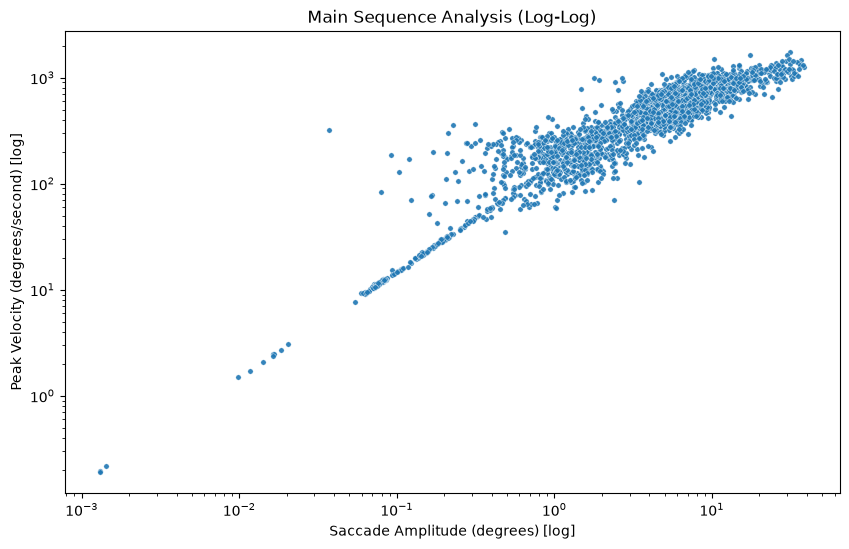

In [723]:
saccade_clean(et_data, ('classes_clean', 'segments_clean'))
plot_main_sequence(et_data, ('classes_clean', 'segments_clean'))

In [724]:
print("Classes clean unique values:", et_data['classes_clean'].value_counts())

Classes clean unique values: classes_clean
Fixation    68210
Saccade     44005
None          117
Name: count, dtype: int64


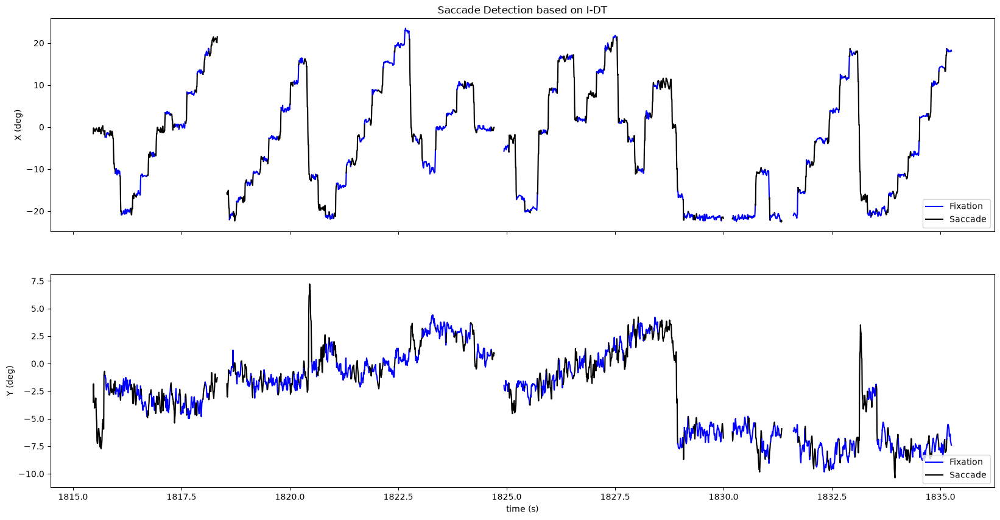

In [725]:
chunk_start = et_data['TIME'].min()
plot_chunk_classification(et_data, (chunk_start, chunk_start + 20), segments_col='segments', classes_col='classes')

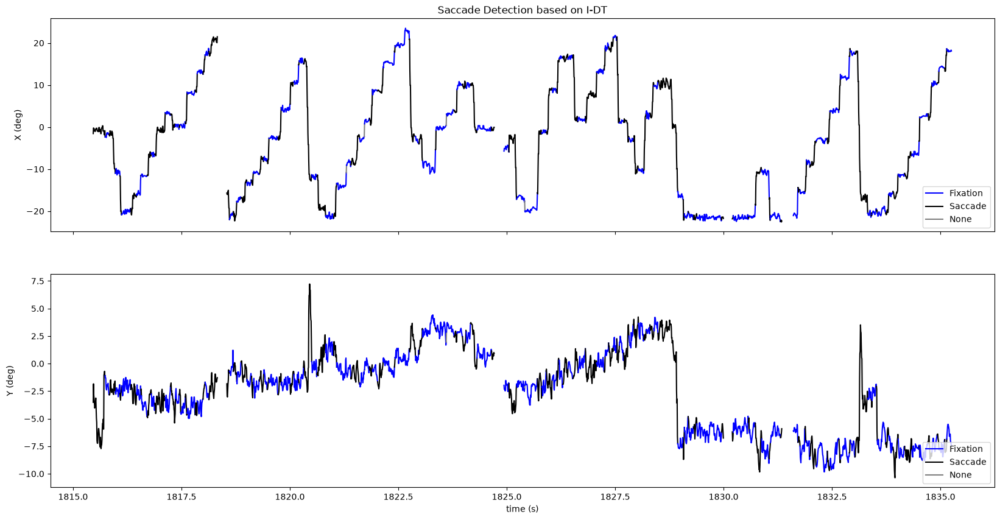

In [726]:
plot_chunk_classification(et_data, (chunk_start, chunk_start + 20), segments_col='segments_clean', classes_col='classes_clean')

### I2MC

In [727]:
opt = {'xres': RESOLUTION[0], 'yres': RESOLUTION[1], 'freq': SMPL_RATE, 'missingx': -9999, 'missingy': -9999, 'disttoscreen': DISTANCE, 'scrSz': SCREEN_SIZE}
df_I2MC = et_data.rename(columns={'TIME': 'time', 'X_px': 'average_X', 'Y_px': 'average_Y'})
df_I2MC['time'] = df_I2MC['time'] * 1000 # convert to milliseconds


fixations, data, _ = I2MC(df_I2MC, opt) # need renaming to match the expected input

I2MC: Searching for valid interpolation windows
I2MC: Replace interpolation windows with Steffen interpolation
I2MC: 2-Means clustering started for averaged signal
I2MC: Determining fixations based on clustering weight mean for averaged signal and separate eyes + 2.00*std


In [728]:
print(f'The cutoff threshold for fixation is {fixations["cutoff"]} (number of std above mean clustering-weight to use as fixation cutoff).')
print(f'The number of fixations detected is {len(fixations["start"])}')

The cutoff threshold for fixation is 1.6538891183876268 (number of std above mean clustering-weight to use as fixation cutoff).
The number of fixations detected is 2383


In [729]:
def i2mc_to_cateyes(fixations, n_samples):
    """
    Convert I2MC fixation output into cateyes' continuous (segments, classes) format.

    fixations : the fix dict from I2MC (uses 'start' and 'end', inclusive indices)
    n_samples : total samples in the trial == len(data)
    """
    classes = np.full(n_samples, "Saccade", dtype=object)

    # paint fixations (I2MC end index is inclusive -> +1 in the slice)
    for s, e in zip(fixations['start'], fixations['end']):
        classes[int(s):int(e) + 1] = "Fixation"

    # segment IDs: bump the counter at every label change
    change = np.empty(n_samples, dtype=bool)
    change[0] = False
    change[1:] = classes[1:] != classes[:-1]
    segments = np.cumsum(change)

    return segments, classes

In [730]:
segments_I2MC, classes_I2MC = i2mc_to_cateyes(fixations, len(et_data))
et_data['segments_I2MC'] = segments_I2MC
et_data['classes_I2MC'] = classes_I2MC
et_data['classes_I2MC_clean'] = classes_I2MC

Classes clean unique values: classes_I2MC
Fixation    93482
Saccade     18850
Name: count, dtype: int64


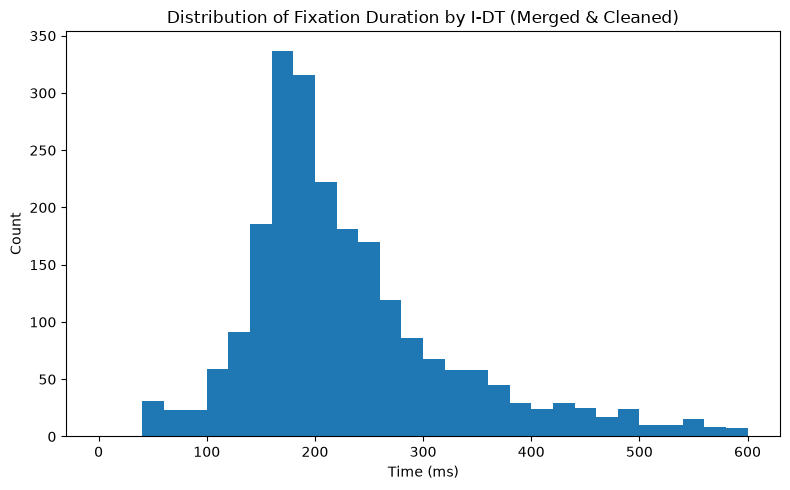

In [731]:
print("Classes clean unique values:", et_data['classes_I2MC'].value_counts())
plot_fixation_distribution(et_data, class_label='classes_I2MC', segment_label='segments_I2MC')

Total Valid Fixations Found: 2194
Classes clean unique values: classes_I2MC_clean
Fixation    76909
Saccade     35423
Name: count, dtype: int64


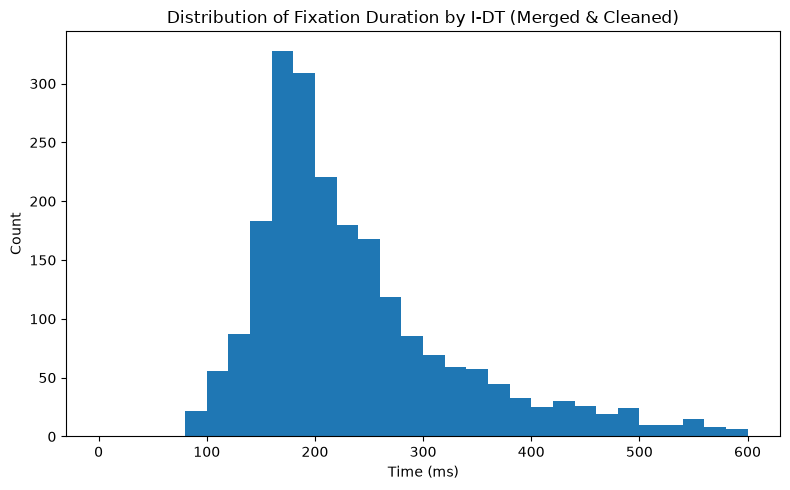

In [732]:
fixation_merge_clean(et_data, ('classes_I2MC', 'segments_I2MC'), ('classes_I2MC_clean', 'segments_I2MC_clean'))

print("Classes clean unique values:", et_data['classes_I2MC_clean'].value_counts())
plot_fixation_distribution(et_data, class_label='classes_I2MC_clean', segment_label='segments_I2MC_clean')

Total Saccades Detected: 2073


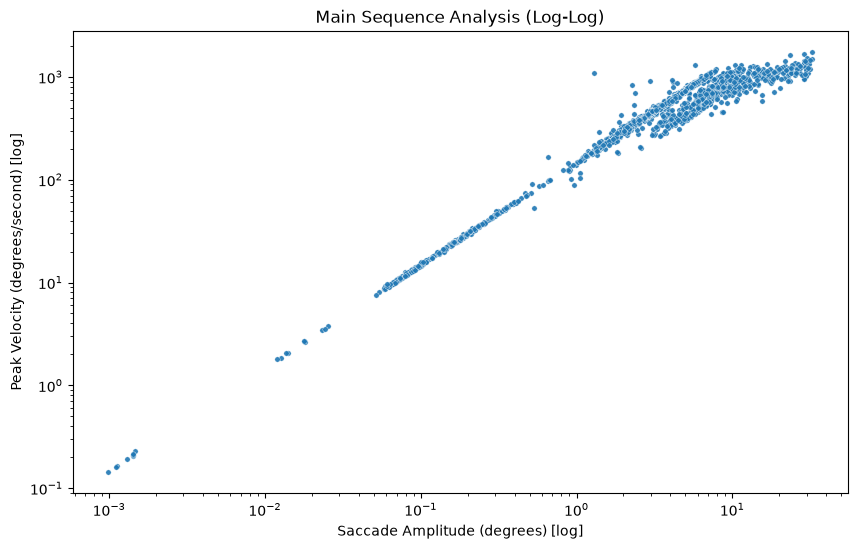

In [733]:
saccade_clean(et_data, ('classes_I2MC_clean', 'segments_I2MC_clean'))
plot_main_sequence(et_data, ('classes_I2MC_clean', 'segments_I2MC_clean'))

In [734]:
print("Classes clean unique values:", et_data['classes_I2MC_clean'].value_counts())

Classes clean unique values: classes_I2MC_clean
Fixation    76909
Saccade     35301
None          122
Name: count, dtype: int64


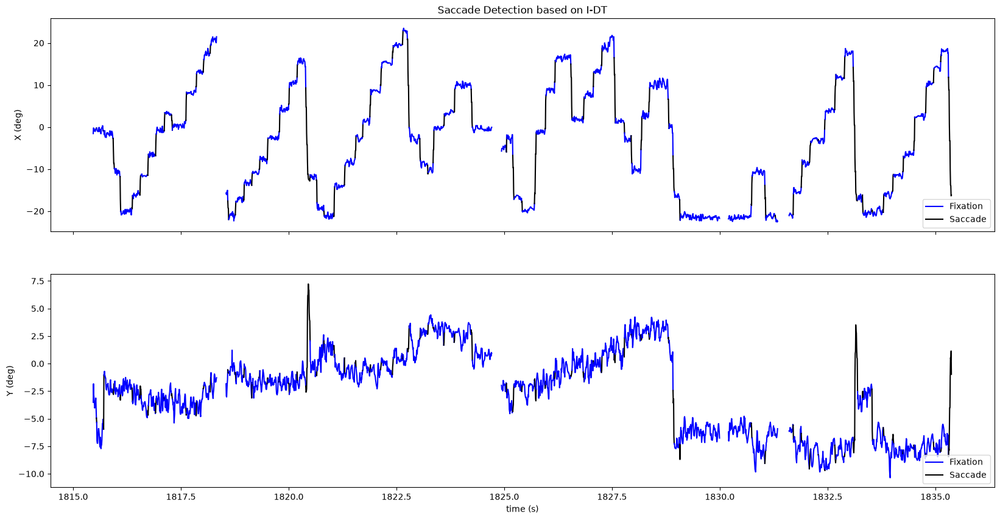

In [735]:
chunk_start = et_data['TIME'].min()
plot_chunk_classification(et_data, (chunk_start, chunk_start + 20), segments_col='segments_I2MC', classes_col='classes_I2MC')

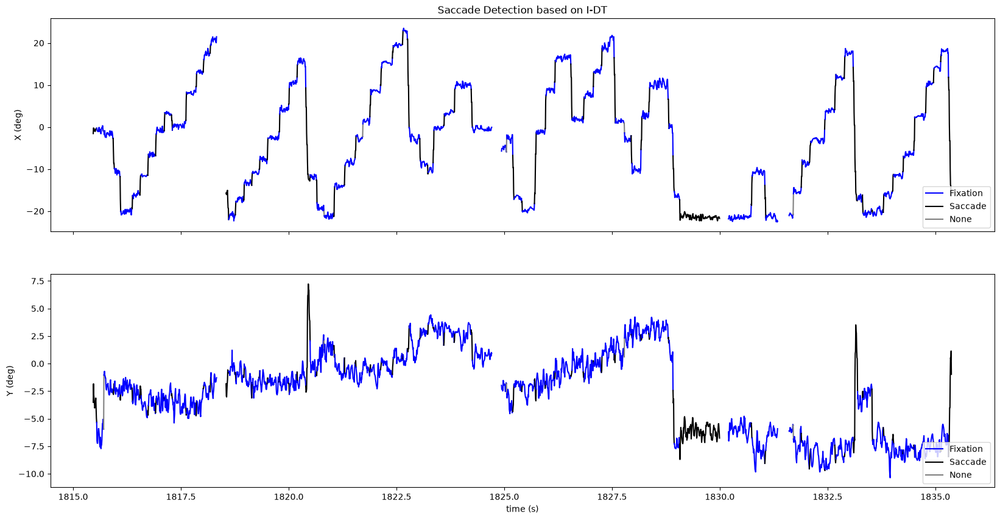

In [736]:
plot_chunk_classification(et_data, (chunk_start, chunk_start + 20), segments_col='segments_I2MC_clean', classes_col='classes_I2MC_clean')

## Segmentation

In [737]:
def get_trial_chunks(data, start_marker, end_marker):
    # to extract samples from each sentences (between sentence onset and question onset)
    starts = data.index[data['USER']==start_marker].tolist()
    print(f"Starts: {starts}")
    ends = data.index[data['USER']==end_marker].tolist()
    print(f"Ends: {ends}")


    chunk_list = []
    for i, (start, end) in enumerate(zip(starts, ends)):
        chunk = data.iloc[start:end].copy()
        chunk['SENTENCE_INDEX'] = i    # assign the sentence index
        chunk_list.append(chunk)

    chunk_data = pd.concat(chunk_list).reset_index(drop=True)
    return chunk_data

fixation_data = get_trial_chunks(et_data, start_marker='FIXATION_ONSET', end_marker='SENTENCE_ONSET')
sentence_data = get_trial_chunks(et_data, start_marker='SENTENCE_ONSET', end_marker='TEXT_ONSET')

Starts: [1973, 7035, 11824, 17469, 23650, 30333, 36154, 42701, 48769, 56865, 61883, 69112, 75515, 82235, 86997, 92599, 99937, 105472]
Ends: [2385, 7419, 12221, 17893, 24000, 30751, 36506, 43131, 49171, 57231, 62255, 69538, 75887, 82607, 87356, 92977, 100294, 105904]
Starts: [2385, 7419, 12221, 17893, 24000, 30751, 36506, 43131, 49171, 57231, 62255, 69538, 75887, 82607, 87356, 92977, 100294, 105904]
Ends: [7006, 11796, 17449, 23614, 30313, 36110, 42653, 48756, 56829, 61823, 69063, 75494, 82190, 86917, 92583, 99925, 105456, 111660]


## accuracy & precision on the fixation cross

In [738]:
#NOTE: move to the top later
FONT_SIZE = 39
FONT_FAM = 'mono'
MARGIN = 150 #px?
WORD_SPACE = 25
WORD_H = 54     #obtainable through w, h = my_canvas.text_size("Hello") in openSesame
LETTER_W = 21     #one letter
PUNC_W = 7


BOX_WIDTH = RESOLUTION[0] - 2 * MARGIN      #1620
TEXT_START_X = - (BOX_WIDTH/2)  #-810
TEXT_START_Y = - RESOLUTION[1] / 2 + 250
LINE_SPACE = FONT_SIZE * 3  #117    #NOTE: not sure if this is correct

#NOTE: check later
CROSS_SIZE = 50
CROSS_X = TEXT_START_X


In [739]:
# # find the position of the fixation cross
# # opensesame script
# width, height = exp.resolution()

# font_size = 39
# font_family = "mono"

# margin = 150
# word_spacing = 25

# box_width = width - (2 * margin)

# text_start_x = -(box_width / 2)
# text_start_y = -height / 2 + 250

# line_height_factor = 3.0
# line_spacing = int(font_size * line_height_factor)

# fixation_canvas = canvas(exp)

# cross_size = 50

# cross_x = text_start_x
# cross_y = text_start_y + (font_size / 2)

# fixation_canvas.line(
#     cross_x - cross_size/2,
#     cross_y,
#     cross_x + cross_size/2,
#     cross_y,
#     penwidth=4,
#     color='white'
# )

# fixation_canvas.line(
#     cross_x,
#     cross_y - cross_size/2,
#     cross_x,
#     cross_y + cross_size/2,
#     penwidth=4,
#     color='white'
# )


In [740]:
# accuracies = []
# precisions = []

# def calculate_accuracy_precision(fixation_data, sentence_data):
#     # Calculate the accuracy and precision for each trial
#     cross_x = text_start_x
#     cross_y = text_start_y + (font_size / 2)

#     centre_x = SCREEN_W / 2 + cross_x
#     centre_y = SCREEN_H / 2 + cross_y

#     cross_x_norm = centre_x / SCREEN_W
#     cross_y_norm = centre_y / SCREEN_H
    
#     for trial_index in fixation_data['SENTENCE_INDEX'].unique():
#         trial_fixations = fixation_data[fixation_data['SENTENCE_INDEX'] == trial_index]

#         # Assuming the sentence data has a column 'TARGET_X' and 'TARGET_Y' for the target position
#         target_x = trial_sentence['TARGET_X'].iloc[0]
#         target_y = trial_sentence['TARGET_Y'].iloc[0]

#         # Calculate accuracy as the mean distance from fixations to the target
#         distances = np.sqrt((trial_fixations['X_deg'] - target_x) ** 2 + (trial_fixations['Y_deg'] - target_y) ** 2)
#         accuracy = distances.mean()
#         accuracies.append(accuracy)

#         # Calculate precision as the standard deviation of distances
#         precision = distances.std()
#         precisions.append(precision)
# t0 = fixation_data["TIME"].iloc[0]


from here we stick with only one fixation method

## Cohen's correction

- in the analysis, maybe remmeber to mention what kind of drift Cohen's correction is able to solve and what does not
- need to find a way to deal with regressions

In [741]:
sentence_data.head()

,CNT,TIME,TIME_TICK,FPOGX,FPOGY,FPOGS,FPOGD,FPOGID,FPOGV,LPOGX,...,Y_deg,segments,classes,classes_clean,segments_clean,segments_I2MC,classes_I2MC,classes_I2MC_clean,segments_I2MC_clean,SENTENCE_INDEX
0,272928,1831.44104,82505146016,0.0,0.0,1831.08582,0.28821,1195,0,0.12077,...,NaN,160,Saccade,Saccade,123,131,Saccade,Saccade,125,0
1,272929,1831.44775,82505212941,0.0,0.0,1831.08582,0.28821,1195,0,0.12077,...,NaN,160,Saccade,Saccade,123,131,Saccade,Saccade,125,0
2,272930,1831.45447,82505279735,0.0,0.0,1831.08582,0.28821,1195,0,0.12077,...,NaN,160,Saccade,Saccade,123,131,Saccade,Saccade,125,0
3,272931,1831.46118,82505346828,0.0,0.0,1831.08582,0.28821,1195,0,0.12077,...,NaN,160,Saccade,Saccade,123,131,Saccade,Saccade,125,0
4,272932,1831.46777,82505413636,0.0,0.0,1831.08582,0.28821,1195,0,0.12077,...,NaN,160,Saccade,Saccade,123,131,Saccade,Saccade,125,0


# Scan path

In [742]:
#NOTE: need to store fixations within each sentence in a seperate dataframe, with their mean coordinates calculated.
def sort_fixation(data, cols):
    '''
    params:
    - data: dataframe storing all the eyetracking data for the sentences
    - cols: a tuple of strings specifying the col names for the fixation data

    outputs:
    - fixations: a dictionary storing fixation info ('start', 'duration', 'x', 'y', 'sentence_i'), coordinates are the mean of the samples belong to one fixation
    '''
    classes, segments = cols
    fixations = data[data[classes] == 'Fixation']
    fix_groups = [group for _, group in fixations.groupby(segments)]
    
    starts, durations, xs_px_center, ys_px_center, xs_deg, ys_deg, sentence_is = [], [], [], [], [], [], []

    for group in fix_groups:
        starts.append(group['TIME'].iloc[0] * 1000) #ms
        durations.append((group['TIME'].iloc[-1] - group['TIME'].iloc[0]) * 1000 + (1000 / SMPL_RATE))     # unit: ms
        xs_px_center.append(group['X_px_center'].mean())
        ys_px_center.append(group['Y_px_center'].mean())
        xs_deg.append(group['X_deg'].mean())
        ys_deg.append(group['Y_deg'].mean())
        sentence_is.append(group['SENTENCE_INDEX'].iloc[0])

    fixations = pd.DataFrame({
        'Start': starts,
        'Duration': durations,
        'X_px_center': xs_px_center,
        'Y_px_center': ys_px_center,
        'X_deg': xs_deg,
        'Y_deg': ys_deg,
        'Sentence_i': sentence_is
    })
        
    return fixations

In [743]:
fixations = sort_fixation(sentence_data, ('classes_I2MC_clean', 'segments_I2MC_clean'))

In [744]:
fixations.head()

,Start,Duration,X_px_center,Y_px_center,X_deg,Y_deg,Sentence_i
0,1831608.52,93.576667,-736.616229,-199.032429,-20.889796,-6.012236,0
1,1831708.98,180.866667,-530.042311,-245.574800,-15.356173,-7.402632,0
2,1831909.91,167.436667,-291.633408,-253.206432,-8.592253,-7.630242,0
3,1832110.84,321.366667,-104.650800,-282.044700,-3.103591,-8.486954,0
4,1832445.56,221.266667,130.054982,-279.481745,3.854909,-8.410202,0


>note: need to truncate the tail as it might contaminate every measure except for first pass measuring 

measures that are affected:
- regressions
- total fixations

measures that are not affected:
- go-past
- first pass fixation

In [760]:
def mark_truncation(fix, truncation):
    out = []
    for i, trial in fix.groupby("Sentence_i", sort=False):
        trial = trial.sort_values("Start").copy()
        truncate_s, truncate_e = truncation[str(i)]
        idx = np.arange(len(trial))
        trial["keep"] = (idx >= truncate_s) & (idx <= truncate_e)    # True=reading, False=tail
        out.append(trial)
    return pd.concat(out).reset_index(drop=True)

In [761]:
fixations_truncated = mark_truncation(fixations, config.fix_truncation[f'subj{SUBJECT}'])

In [765]:
fixations_truncated.head()

,Start,Duration,X_px_center,Y_px_center,X_deg,Y_deg,Sentence_i,keep
0,1831608.52,93.576667,-736.616229,-199.032429,-20.889796,-6.012236,0,True
1,1831708.98,180.866667,-530.042311,-245.574800,-15.356173,-7.402632,0,True
2,1831909.91,167.436667,-291.633408,-253.206432,-8.592253,-7.630242,0,True
3,1832110.84,321.366667,-104.650800,-282.044700,-3.103591,-8.486954,0,True
4,1832445.56,221.266667,130.054982,-279.481745,3.854909,-8.410202,0,True


In [ ]:
#NOTE: need to truncate the tail
def end_of_reading_index(trial_fix, last_line_y, line_tol=LINE_SPACE/3, min_frac=1.0):
    """
    trial_fix   : one trial's fixations, temporal order (fixation-level).
    last_line_y : Y_px of this trial's final line (your CSV column).
    line_tol    : ~half the line spacing in px — how close to last_line_y
                  counts as 'on the last line'.
    min_frac    : guard — ignore last-line hits in the first `min_frac` of the
                  trial's fixations, so an early stray glance to the bottom
                  doesn't trigger a premature cut.
    """
    y = trial_fix['Y_px_center'].to_numpy()
    n = len(y)
    floor = int(min_frac * n)
    for i in range(n):
        if i >= floor and -(y[i] - last_line_y) <= line_tol:
            return i+1
    return n - 1          # never clearly finished → keep everything

In [ ]:
def find_placement(row):
    """Replay OpenSesame layout. LETTER_W is calibrated per-trial from the
    logged RN AOI so it matches the actual rendered glyph advance."""
    tsx     = float(row['text_start_x'])
    tsy     = float(row['text_start_y'])
    box_w   = float(row['box_width'])

    sentence = re.sub(r'<[^>]+>', '', str(row['display_sentence']))

    # calibrate the per-character advance from a word whose real box we logged
    rn_word = re.sub(r'</?[^>]+>', '', str(row['RN']))
    letter_w = (float(row['rn_x2']) - float(row['rn_x1'])) / max(len(rn_word), 1)  # ~22.71
    print(rn_word)
    print(f'letter width is: {letter_w}')

    placed = []
    px, py = tsx, tsy
    for w in sentence.split():
        word_width = len(w) * letter_w                 # monospace: uniform per char
        if (px - tsx) + word_width > box_w:            # OpenSesame line wrap
            px, py = tsx, py + LINE_SPACE       #NOTE: the line space is probably not that big -> no, this should be correct. line space is the space between baselines, not gap in between 
        placed.append((w, px, py))
        px += word_width + WORD_SPACE
    return placed

In [ ]:
# DEBUG
sentence = events_data_selected.iloc[0]
#sentence = re.sub(r'</?[^>]+>', '', str(sentence))
#sentence_et.head()
placed = find_placement(sentence)
unique_values = sorted(set(map(lambda x: x[2], placed)))

print(unique_values)
print(placed)

Krankenschwestern
letter width is: 22.705882352941178
[-290.0, -173.0, -56.0, 61.0, 178.0]
[('Bei', -810.0, -290.0), ('einer', -716.8823529411765, -290.0), ('Informationsveranstaltung', -578.3529411764706, -290.0), ('im', 14.294117647058783, -290.0), ('Krankenhaus', 84.70588235294113, -290.0), ('wird', 359.47058823529403, -290.0), ('über', 475.2941176470587, -290.0), ('aktuelle', 591.1176470588234, -290.0), ('Impfreformen', -810.0, -173.0), ('und', -512.5294117647059, -173.0), ('deren', -419.4117647058823, -173.0), ('Auswirkungen', -280.88235294117646, -173.0), ('gesprochen.', 16.58823529411768, -173.0), ('Die', 291.3529411764706, -173.0), ('Krankenschwestern', 384.47058823529414, -173.0), ('diskutieren', -810.0, -56.0), ('über', -535.2352941176471, -56.0), ('Langzeitfolgen', -419.4117647058824, -56.0), ('von', -76.52941176470591, -56.0), ('Corona', 16.588235294117624, -56.0), ('und', 177.8235294117647, -56.0), ('setzen', 270.94117647058823, -56.0), ('sich', 432.1764705882353, -56.0), 

In [ ]:
### okay wanted to try eyekit text layout, but it requires us to stores the text in seperate lines the same way they are shown in the experiment.
### wait but we can try to process the text into multiple lines first using the placement function
# txt = eyekit.TextBlock(
#     sentence_et,
#     position=
# )

In [865]:
def plot_scanpath(event_data, fixation_data, sentence_i, truncate_i=-1, excluded=EXCLUSION, show_numbers=False):
    FONT_PATH = '/Users/qianyueli/Documents/fonts/droid-sans-mono/DroidSansMono.ttf'
    _FONT_PIL = ImageFont.truetype(FONT_PATH, FONT_SIZE)
    _FONT_PROP = font_manager.FontProperties(fname=FONT_PATH)
    
    row = event_data.iloc[sentence_i]

    # get the coordinates of AOIs
    rn = row[['rn_x1','rn_x2','rn_y1','rn_y2']].astype(float)
    an = row[['an_x1','an_x2','an_y1','an_y2']].astype(float)
    spill = row[['spill_x1','spill_x2','spill_y1','spill_y2']].astype(float)

    #NOTE: can replace with global variable. but need to check
    tx1 = float(row['text_start_x'])
    tx2 = float(row['text_start_x']) + float(row['box_width'])
    ty1 = float(row['text_start_y'])
    ty2 = float(row['last_line_y']) + FONT_SIZE
    text_box = (tx1, tx2, ty1, ty2)

    an_word = re.sub(r'<[^>]+>', '', str(row['AN']))
    rn_word = re.sub(r'<[^>]+>', '', str(row['RN']))


 
    # ----- plot -------
    fig, ax = plt.subplots(figsize=(15, 8.5)); ax.set_facecolor('#fafafa')
    ax.set_xlim(-RESOLUTION[0]/2, RESOLUTION[0]/2)
    ax.set_ylim(-RESOLUTION[1]/2, RESOLUTION[1]/2)
    ax.invert_yaxis()

    #size text from the logged word height
    #NOTE: need to check
    fig.canvas.draw()
    p0 = ax.transData.transform((0,0)); p1 = ax.transData.transform((0, FONT_SIZE))
    font_pt = abs(p1[1]-p0[1]) * 72 / fig.dpi
    # after computing font_pt from WORD_H:
    probe = ax.text(0, 0, "M"*20, fontproperties=_FONT_PROP, fontsize=font_pt, alpha=0)
    bb = probe.get_window_extent()
    inv = ax.transData.inverted()
    drawn_char_w = abs(inv.transform((bb.x1, 0))[0] - inv.transform((bb.x0, 0))[0]) / 20
    probe.remove()

    letter_w = (float(row['rn_x2']) - float(row['rn_x1'])) / max(len(rn_word), 1)  # ~22.71
    font_pt = font_pt * (letter_w / drawn_char_w)     # shrink glyphs to match real advance



    # Draw the background text
    for w, wx, wy in find_placement(row):
        ax.text(wx, wy, w, 
                fontproperties=_FONT_PROP,  
                fontsize=font_pt,        
                ha='left',               
                va='top',                
                color='0.8', 
                zorder=0)

    # Pin RN/AN to exact box centres
    for pfx, wtxt in [('rn', rn_word), ('an', an_word)]:
        ax.text(float(row[f'{pfx}_x1']), float(row[f'{pfx}_y1']), wtxt,
                fontproperties=_FONT_PROP, fontsize=font_pt,
                ha='left', va='top', color='0.25', fontweight='bold', zorder=1)


    # Text box (dashed gray)
    ax.add_patch(Rectangle((text_box[0], text_box[2]), text_box[1]-text_box[0],
                 text_box[3]-text_box[2], lw=1.2, ls='--',
                 edgecolor='0.5', facecolor='none', zorder=2, label='text box'))


    # RN Box (Green)
    ax.add_patch(Rectangle((rn['rn_x1'], rn['rn_y1']), rn['rn_x2']-rn['rn_x1'],
                 rn['rn_y2']-rn['rn_y1'], lw=2, edgecolor='green',
                 facecolor='none', zorder=4, label=f'RN: "{rn_word}"'))
                 
    # AN Box (Blue)
    ax.add_patch(Rectangle((an['an_x1'], an['an_y1']), an['an_x2']-an['an_x1'],
                 an['an_y2']-an['an_y1'], lw=2, edgecolor='blue',
                 facecolor='none', zorder=4, label=f'AN: "{an_word}"'))

    # Spillover Box (Purple)
    ax.add_patch(Rectangle((spill['spill_x1'], spill['spill_y1']), spill['spill_x2']-spill['spill_x1'],
                 spill['spill_y2']-spill['spill_y1'], lw=2, edgecolor='purple',
                 facecolor='none', zorder=4, label='Spillover'))


    # Fixations for the specified sentence
    fixations = fixation_data[
        fixation_data["Sentence_i"] == sentence_i
    ].copy()

    #keep = end_of_reading_index(fixations, float(row['last_line_y']))
    fixations = fixations[:truncate_i]

    if not fixations.empty:
        fx = fixations["X_px_center"].to_numpy(float)
        fy = fixations["Y_px_center"].to_numpy(float)

        # value driving the colour: real elapsed time if available, else fixation order
        if "Start" in fixations.columns:
            c_vals = fixations["Start"].to_numpy(float) / 1000
            c_vals = c_vals - c_vals.min()          # start the scale at 0
            c_label = "Time since first fixation"
        else:
            c_vals = np.arange(len(fixations), dtype=float)
            c_label = "Fixation order"

        cmap = plt.cm.viridis
        norm = Normalize(vmin=c_vals.min(), vmax=c_vals.max())

        # 1. Scanpath: each segment coloured by the time of its earlier endpoint
        if len(fx) > 1:
            pts = np.column_stack([fx, fy])
            segs = np.stack([pts[:-1], pts[1:]], axis=1)
            lc = LineCollection(segs, cmap=cmap, norm=norm,
                                alpha=0.6, linewidth=1.5, zorder=3)
            lc.set_array(c_vals[:-1])
            ax.add_collection(lc)

        # 2. Fixation points: colour = time, size = duration
        sc = ax.scatter(fx, fy,
                        s=fixations["Duration"] * 0.5,
                        c=c_vals, cmap=cmap, norm=norm,
                        edgecolor="black", alpha=0.85, zorder=4)

        # 3. Colourbar so the time mapping is readable
        cbar = fig.colorbar(sc, ax=ax, fraction=0.03, pad=0.02)
        cbar.set_label(c_label)

        # 4. Optional sequence numbers
        if show_numbers:
            for i in range(len(fx)):
                ax.text(fx[i], fy[i], str(i + 1),
                        fontsize=9, ha="center", va="center",
                        color="white", weight="bold", zorder=5,
                        path_effects=[pe.withStroke(linewidth=2, foreground="black")])
    else:
        print(f"No fixations found for sentence index {sentence_i}")

    ax.legend(loc="upper right")
    plt.title(f'Scan path for Subject {SUBJECT} - Trial {sentence_i} (truncated from {truncate_i})')
    plt.show()

    #NOTE: remember to add title; and change the color of the AOI boxes (red?)

>note: the overlay does not map to how text is displayed in opensesame exactly. The starting position of each word matches, but bc the different font/rendering, the length of each word is slightly off, which lead the uneven spacing between each word unlike the uniform spacing in opensesame interface.

>NOTE: need check subj3 - sentence 16: bad misalignment

Krankenschwestern
letter width is: 22.705882352941178


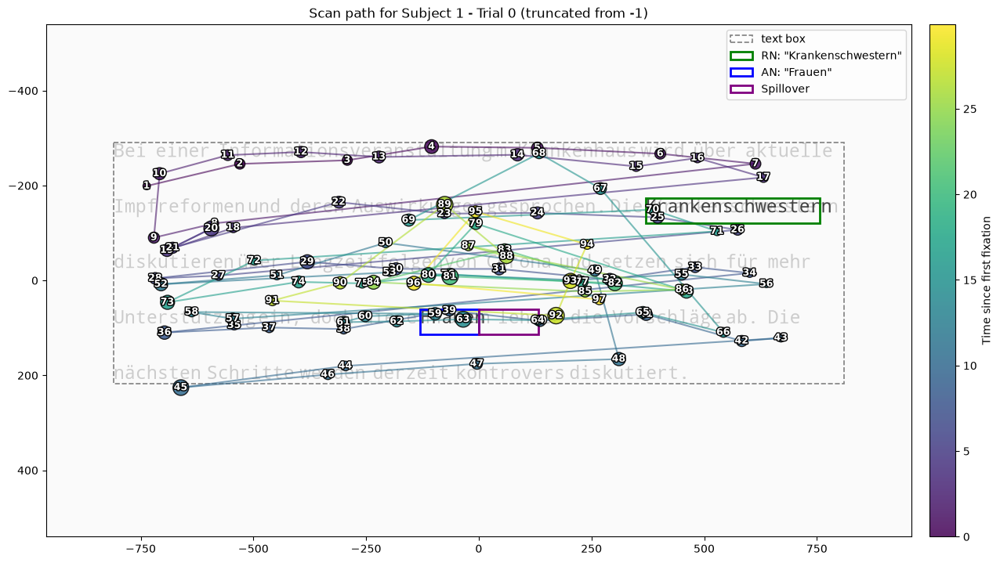

Krankenschwestern
letter width is: 22.705882352941178


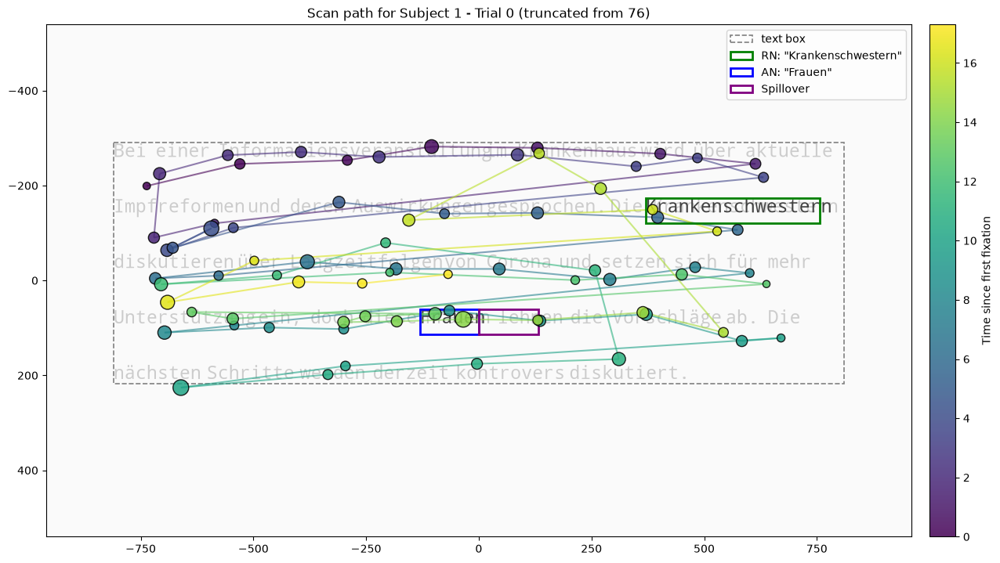

Krankenschwestern
letter width is: 22.705882352941178


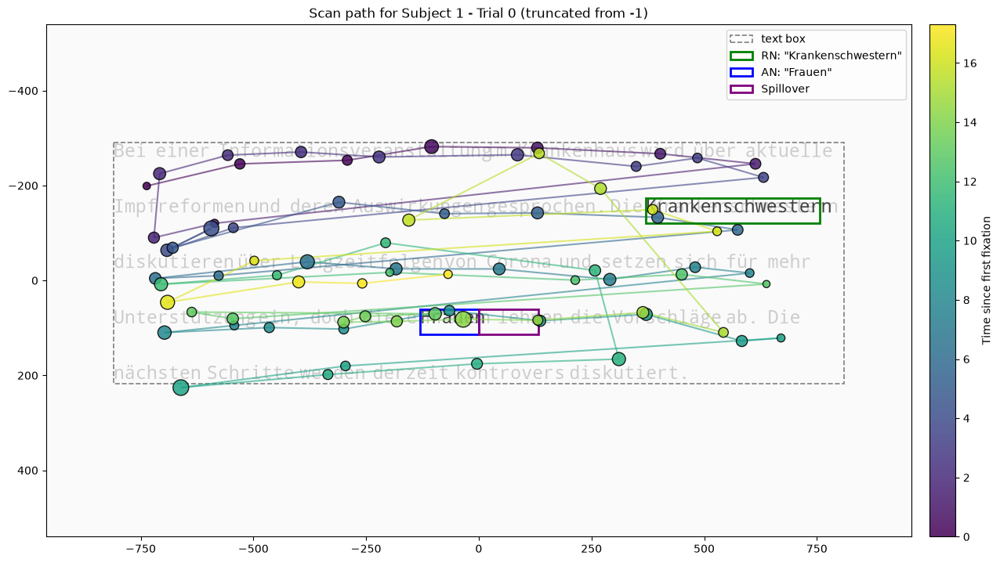

In [866]:
plot_scanpath(events_data_selected, fixations_truncated, 0, show_numbers=True)
plot_scanpath(events_data_selected, fixations_truncated, 0, truncate_i=76)
plot_scanpath(events_data_selected, fixations_truncated[fixations_truncated['keep']==True], 0)

Pfleger
letter width is: 22.285714285714285


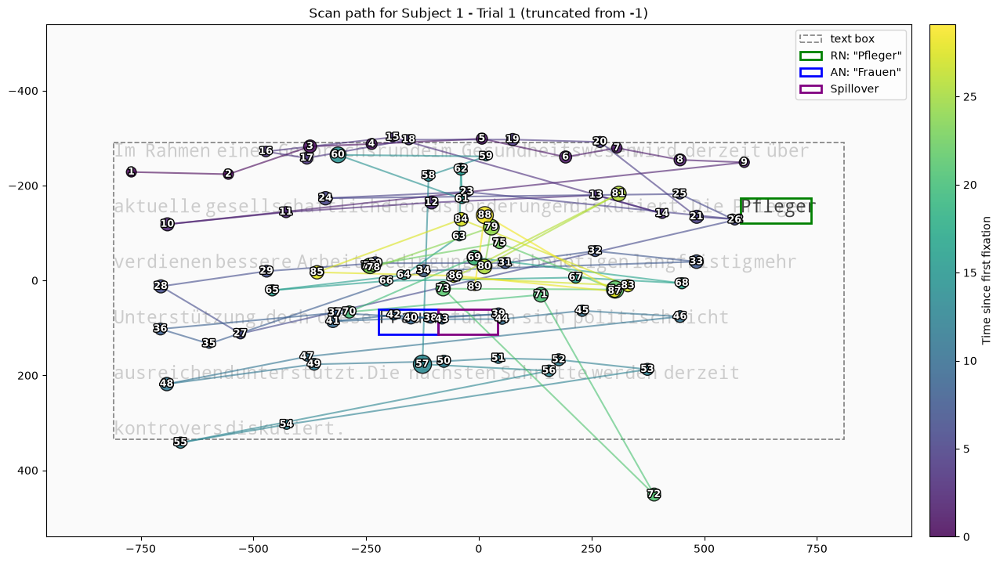

Pfleger
letter width is: 22.285714285714285


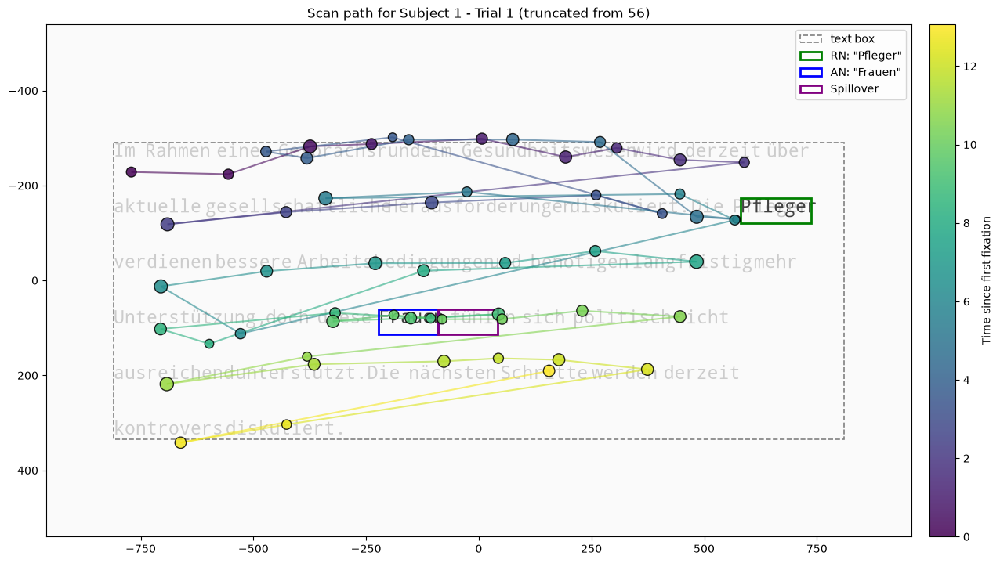

In [867]:
plot_scanpath(events_data_selected, fixations_truncated, 1, show_numbers=True)
plot_scanpath(events_data_selected, fixations_truncated, 1, truncate_i=56)

Experten
letter width is: 22.375


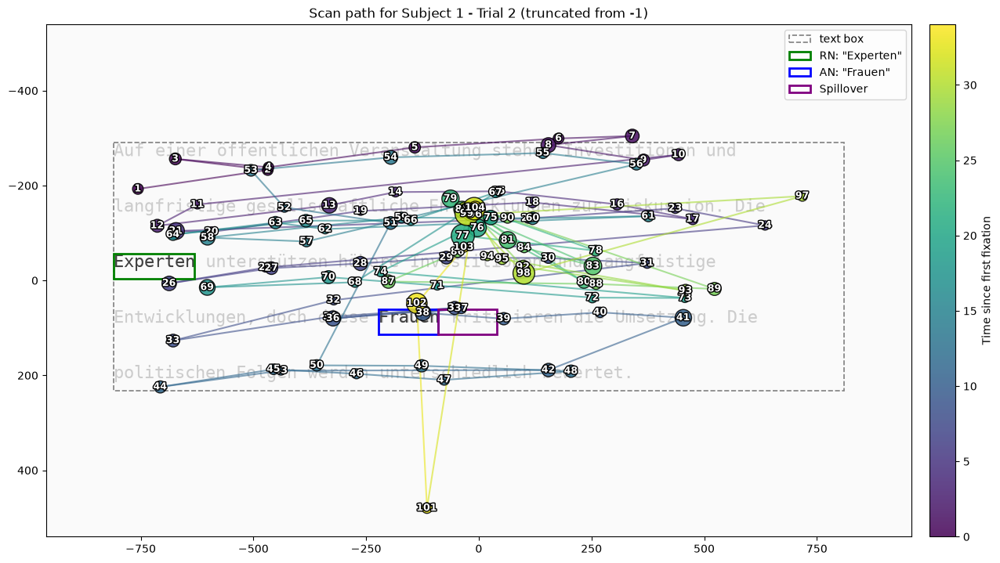

Experten
letter width is: 22.375


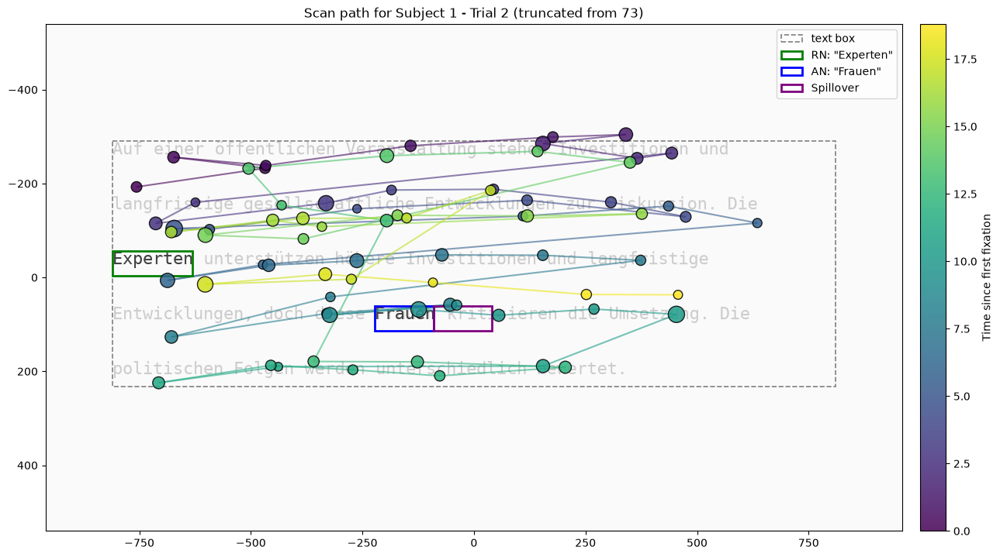

In [ ]:
plot_scanpath(events_data_selected, fixations_truncated, 2, show_numbers=True)
plot_scanpath(events_data_selected, fixations_truncated, 2, truncate_i=73)

Einwohner
letter width is: 22.444444444444443


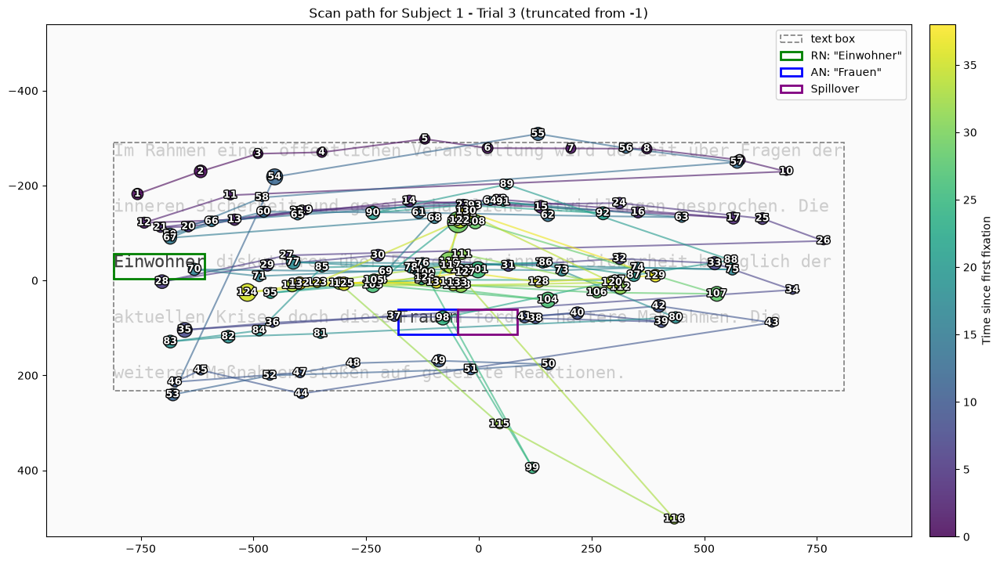

Einwohner
letter width is: 22.444444444444443


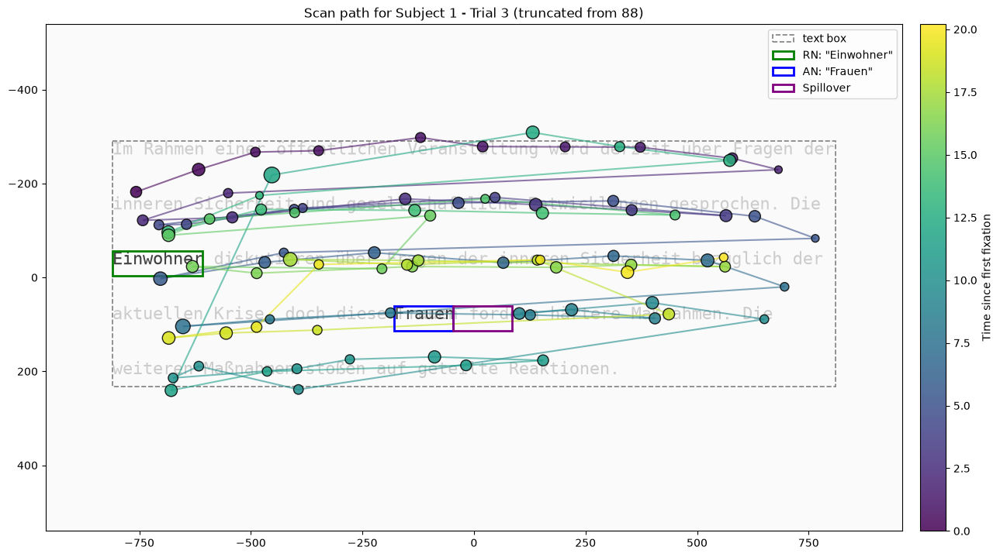

In [ ]:
plot_scanpath(events_data_selected, fixations_truncated, 3, show_numbers=True)
plot_scanpath(events_data_selected, fixations_truncated, 3, truncate_i=88)

Arbeitnehmer*innen
letter width is: 22.88888888888889


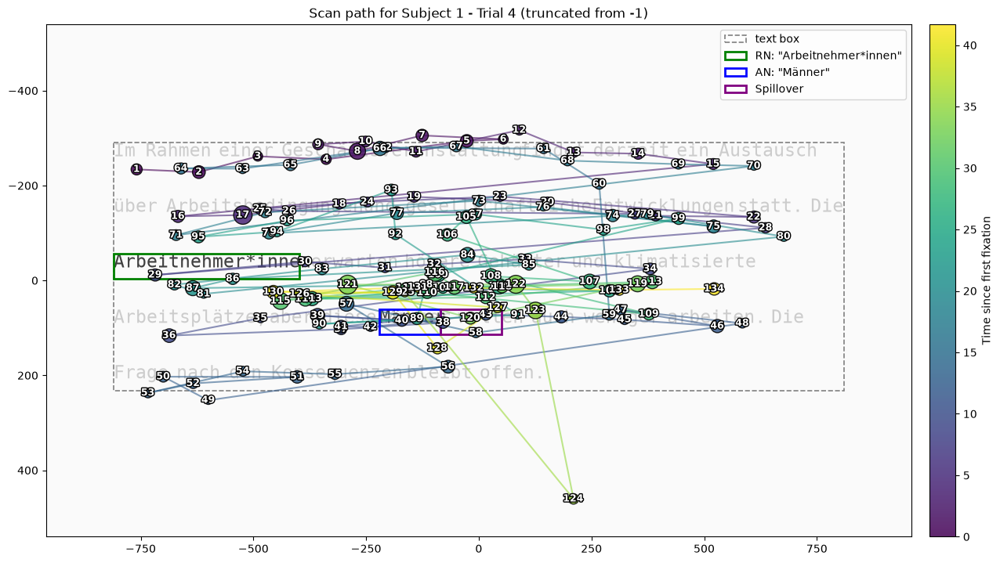

Arbeitnehmer*innen
letter width is: 22.88888888888889


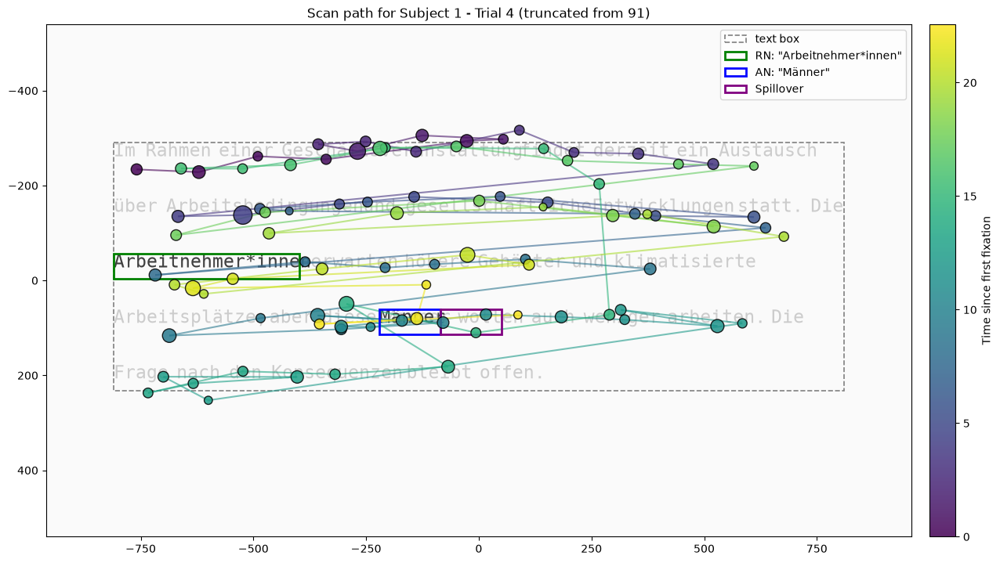

In [ ]:
plot_scanpath(events_data_selected, fixations_truncated, 4, show_numbers=True)
plot_scanpath(events_data_selected, fixations_truncated, 4, truncate_i=91)

Polizist*innen
letter width is: 22.642857142857142


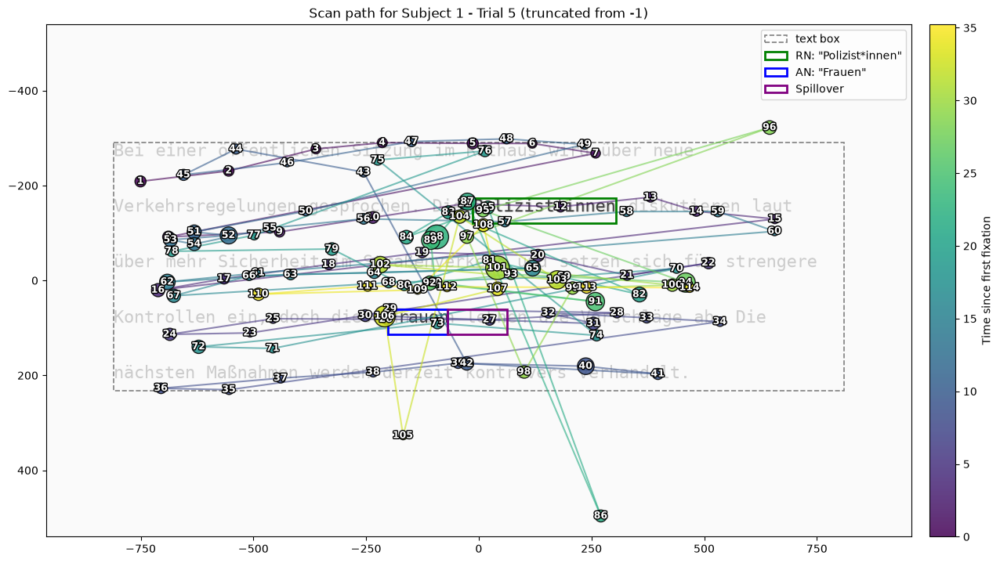

Polizist*innen
letter width is: 22.642857142857142


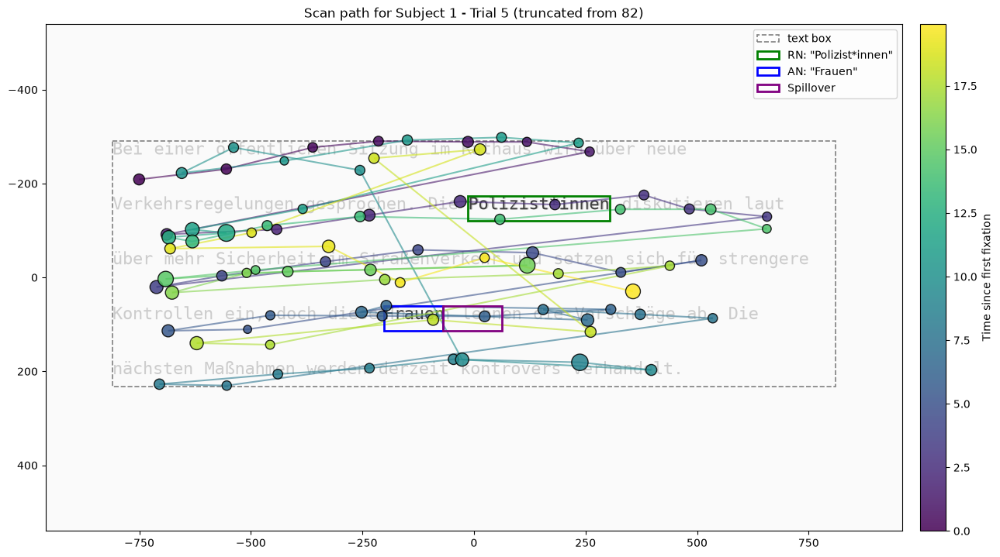

In [ ]:
plot_scanpath(events_data_selected, fixations_truncated, 5, show_numbers=True)
plot_scanpath(events_data_selected, fixations_truncated, 5, truncate_i=82)

Unternehmerinnen
letter width is: 22.75


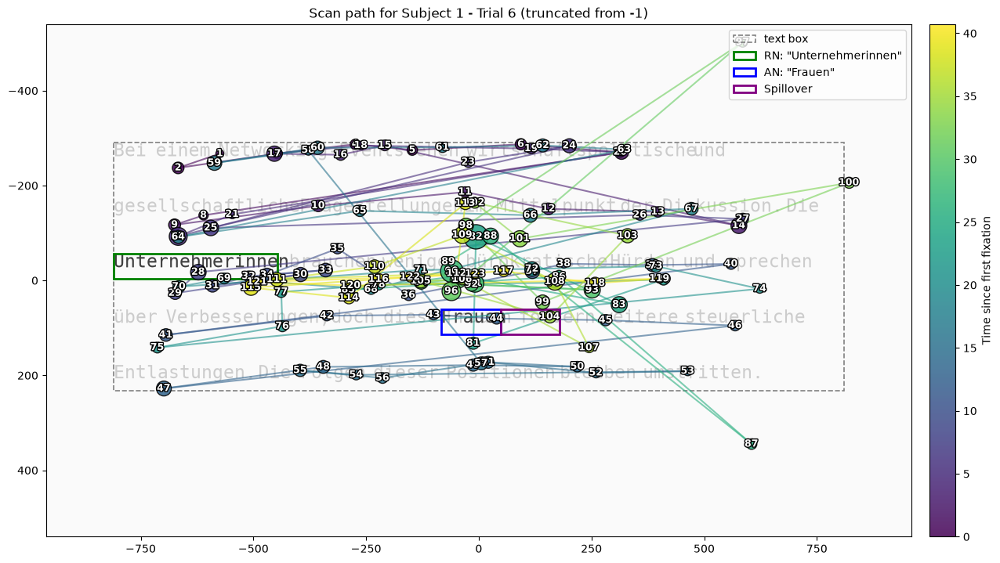

Unternehmerinnen
letter width is: 22.75


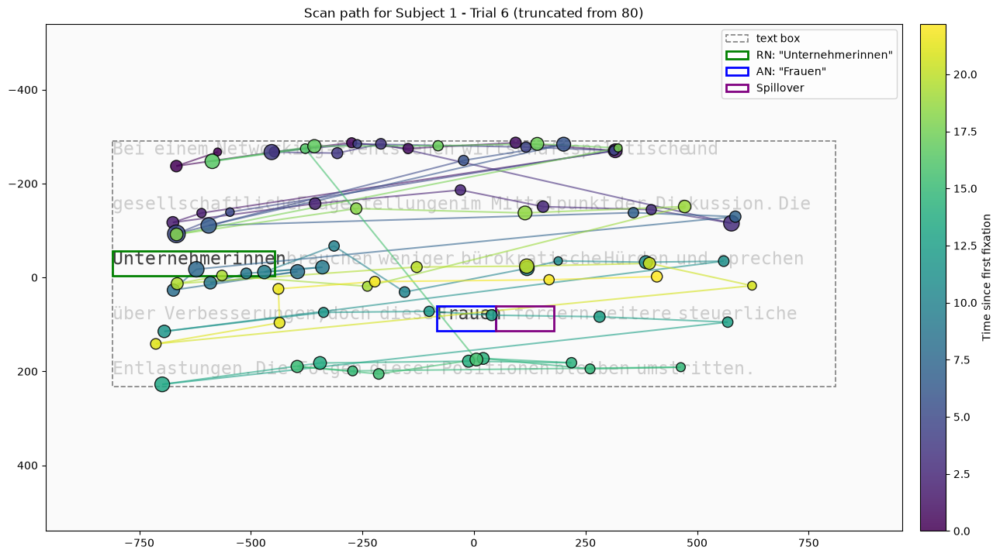

In [ ]:
plot_scanpath(events_data_selected, fixations_truncated, 6, show_numbers=True)
plot_scanpath(events_data_selected, fixations_truncated, 6, truncate_i=80)

Ingenieur*innen
letter width is: 22.6


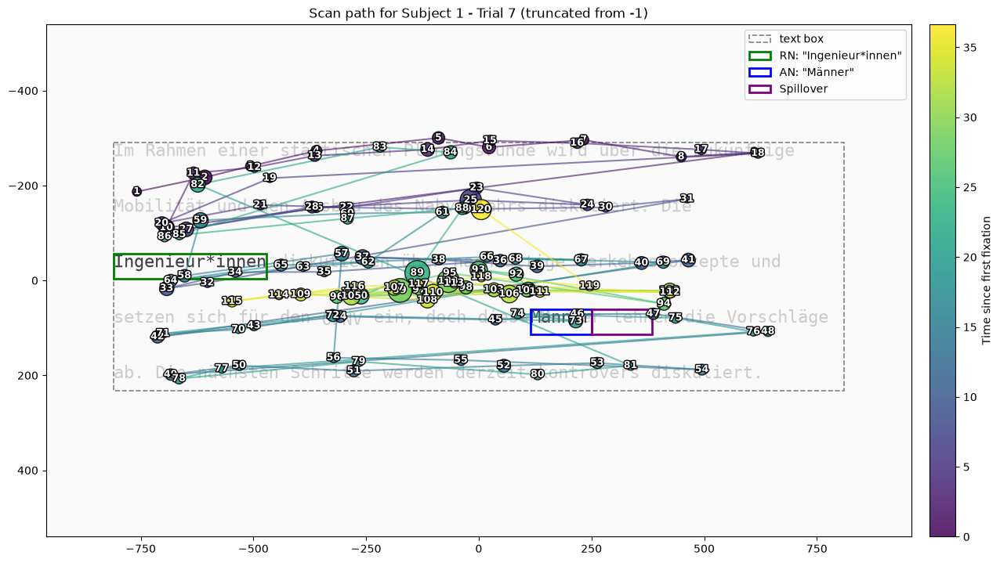

Ingenieur*innen
letter width is: 22.6


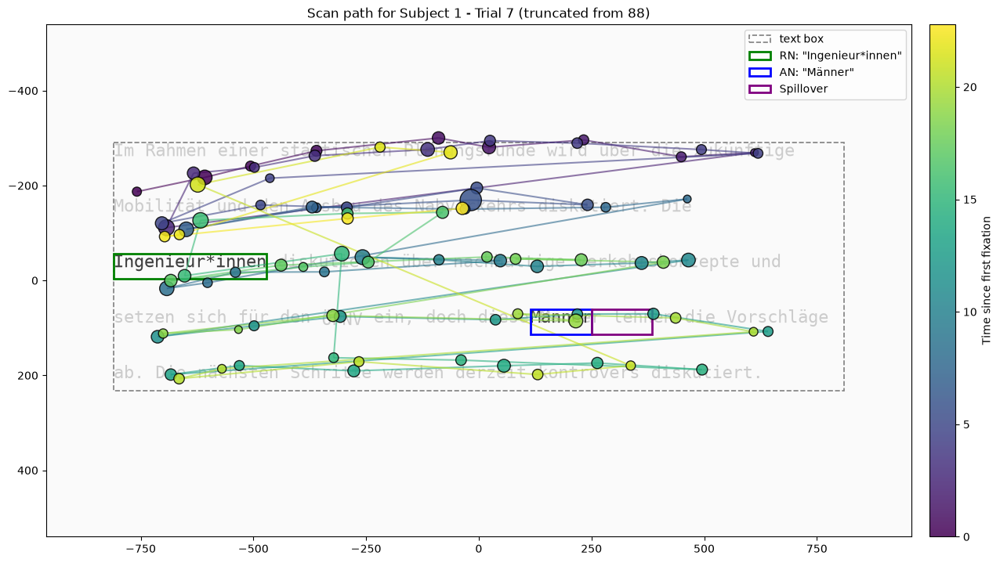

In [ ]:
plot_scanpath(events_data_selected, fixations_truncated, 7, show_numbers=True)
plot_scanpath(events_data_selected, fixations_truncated, 7, truncate_i=88)

Einwohner
letter width is: 22.444444444444443


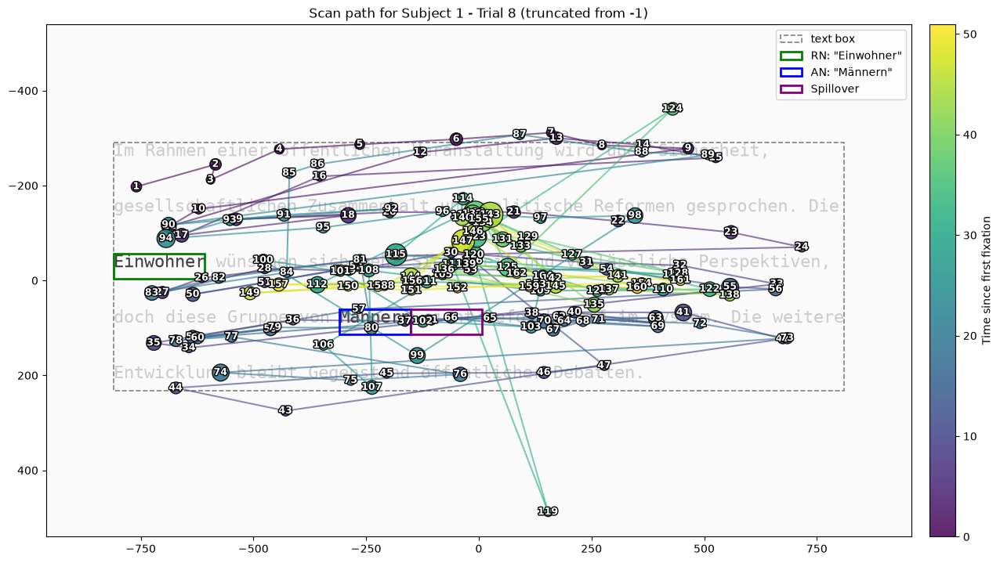

Einwohner
letter width is: 22.444444444444443


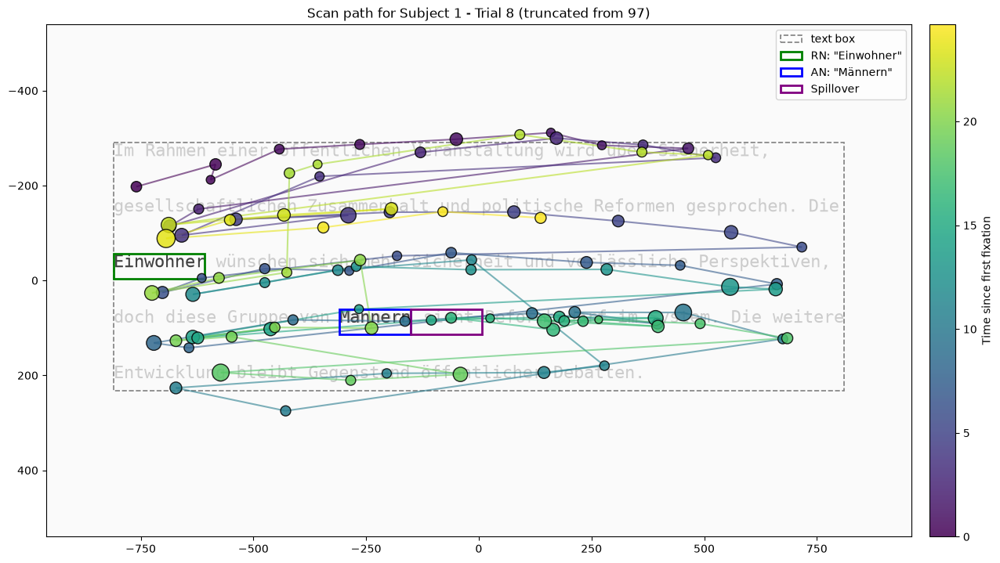

In [ ]:
plot_scanpath(events_data_selected, fixations_truncated, 8, show_numbers=True)
plot_scanpath(events_data_selected, fixations_truncated, sentence_i=8, truncate_i=97)

Experten
letter width is: 22.375


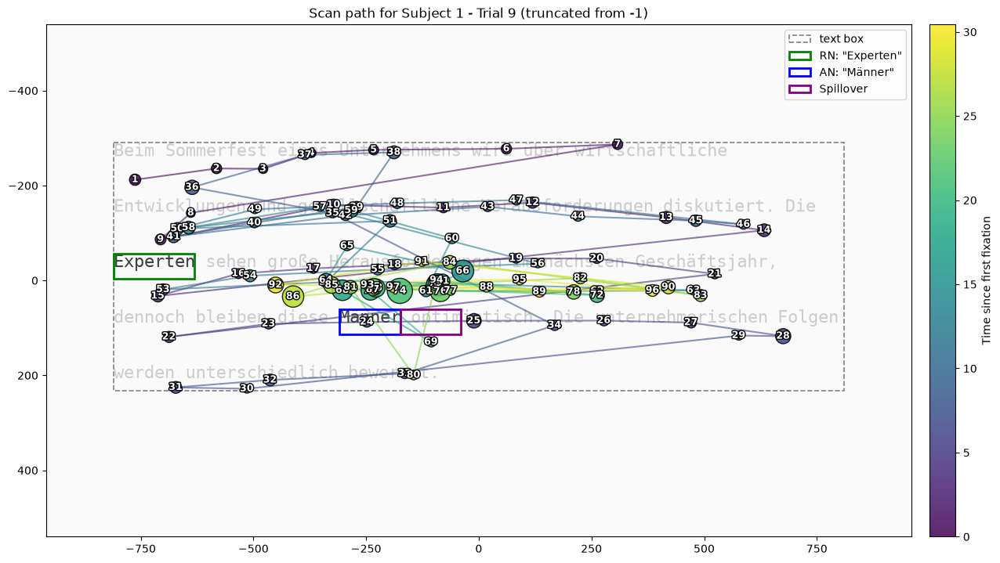

Experten
letter width is: 22.375


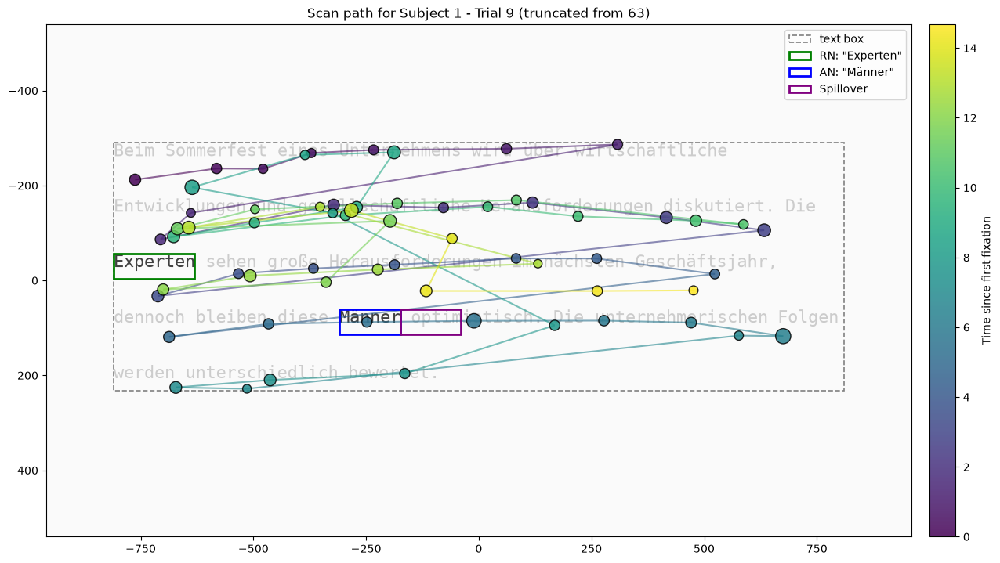

In [ ]:
plot_scanpath(events_data_selected, fixations_truncated, 9, show_numbers=True)
plot_scanpath(events_data_selected, fixations_truncated, sentence_i=9, truncate_i=63)

Aktivist*innen
letter width is: 22.857142857142858


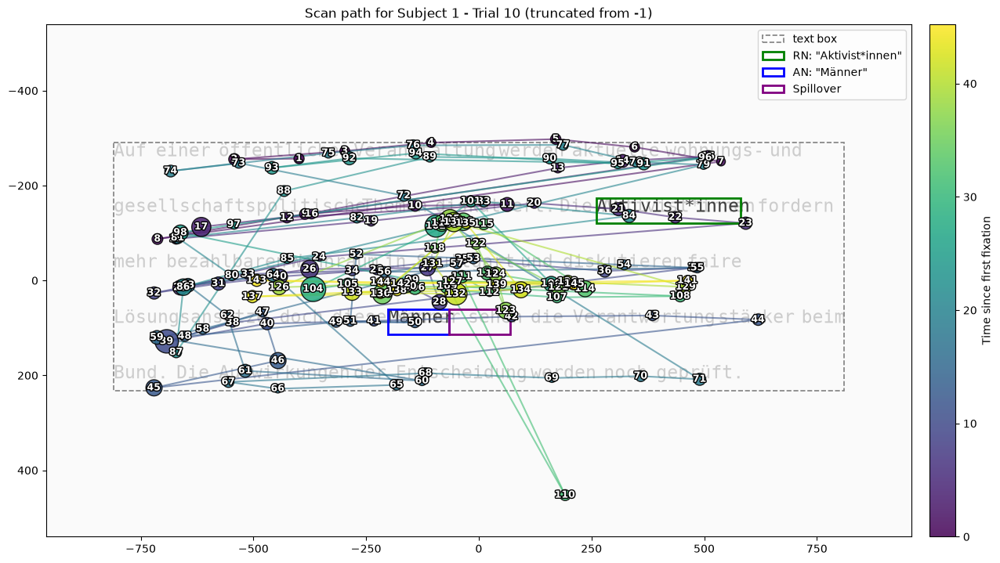

Aktivist*innen
letter width is: 22.857142857142858


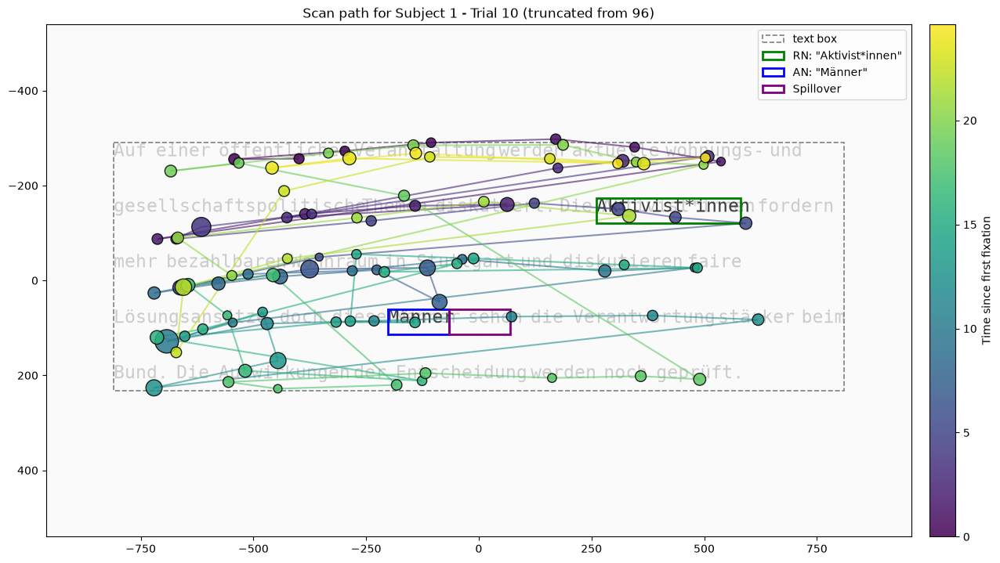

In [ ]:
plot_scanpath(events_data_selected, fixations_truncated, 10, show_numbers=True)
plot_scanpath(events_data_selected, fixations_truncated, sentence_i=10, truncate_i=96)

Dozentinnen
letter width is: 22.636363636363637


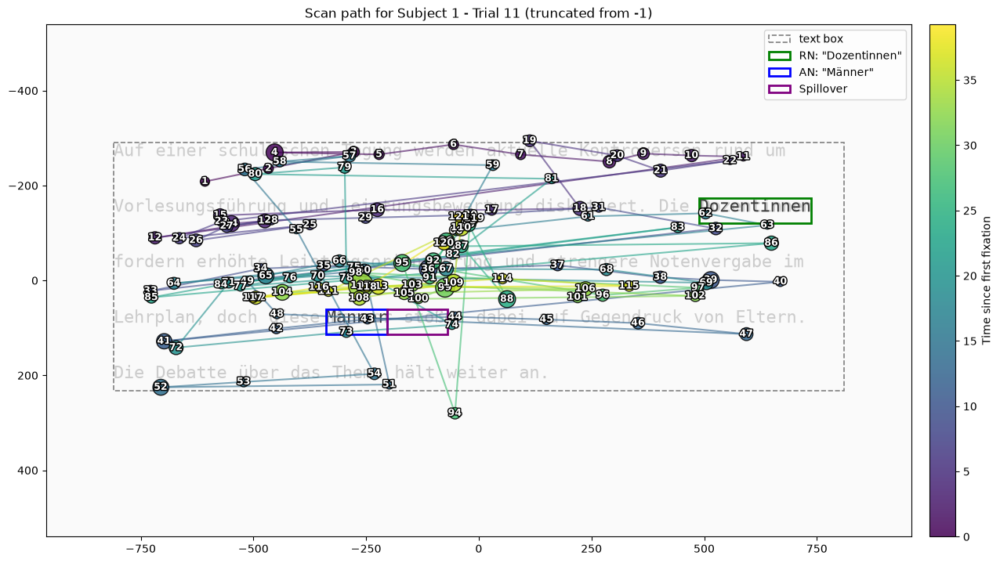

Dozentinnen
letter width is: 22.636363636363637


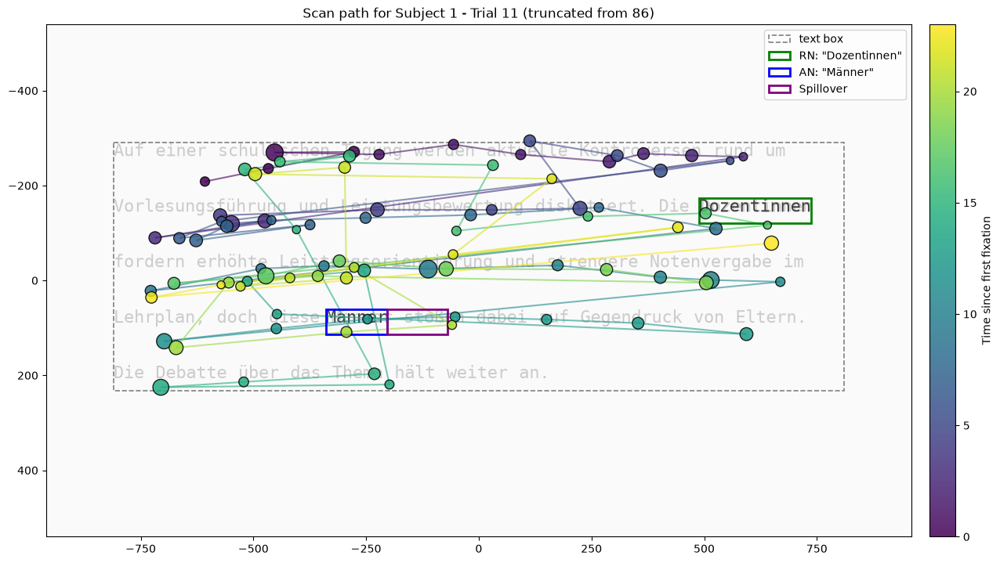

In [ ]:
plot_scanpath(events_data_selected, fixations_truncated, 11, show_numbers=True)
plot_scanpath(events_data_selected, fixations_truncated, sentence_i=11, truncate_i=86)

Professorinnen
letter width is: 22.642857142857142


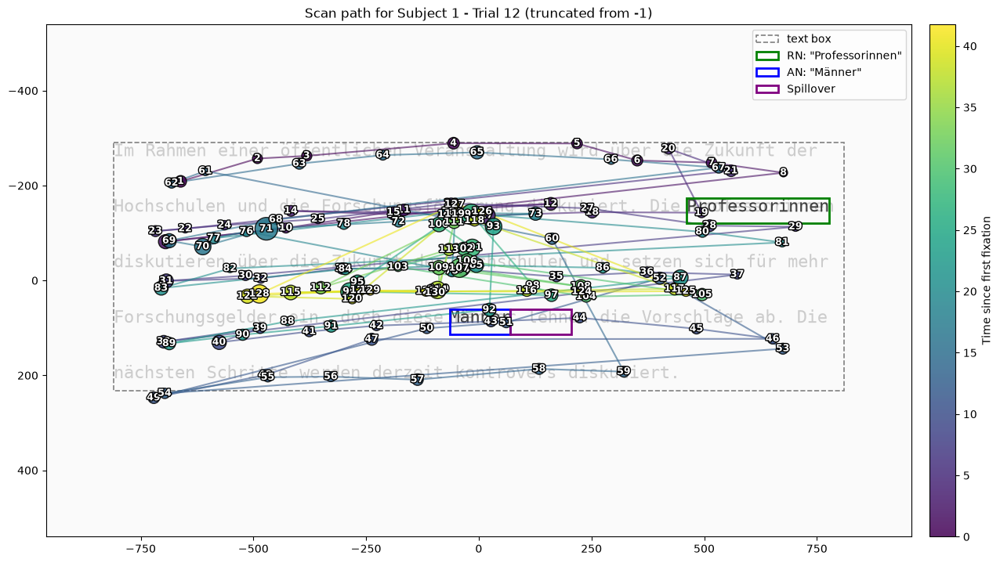

Professorinnen
letter width is: 22.642857142857142


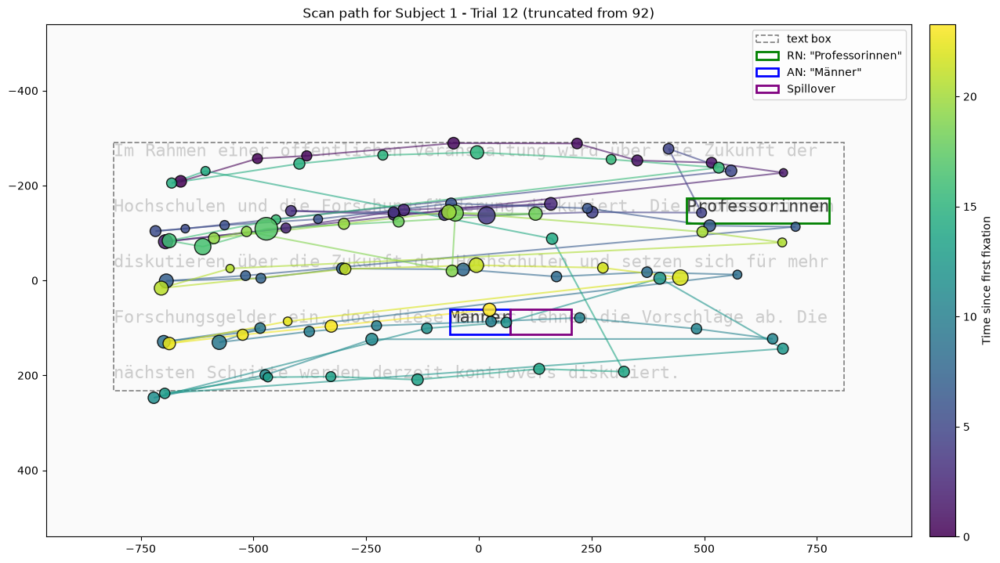

In [ ]:
plot_scanpath(events_data_selected, fixations_truncated, 12, show_numbers=True)
plot_scanpath(events_data_selected, fixations_truncated, sentence_i=12, truncate_i=92)

Lehrer*innen
letter width is: 22.5


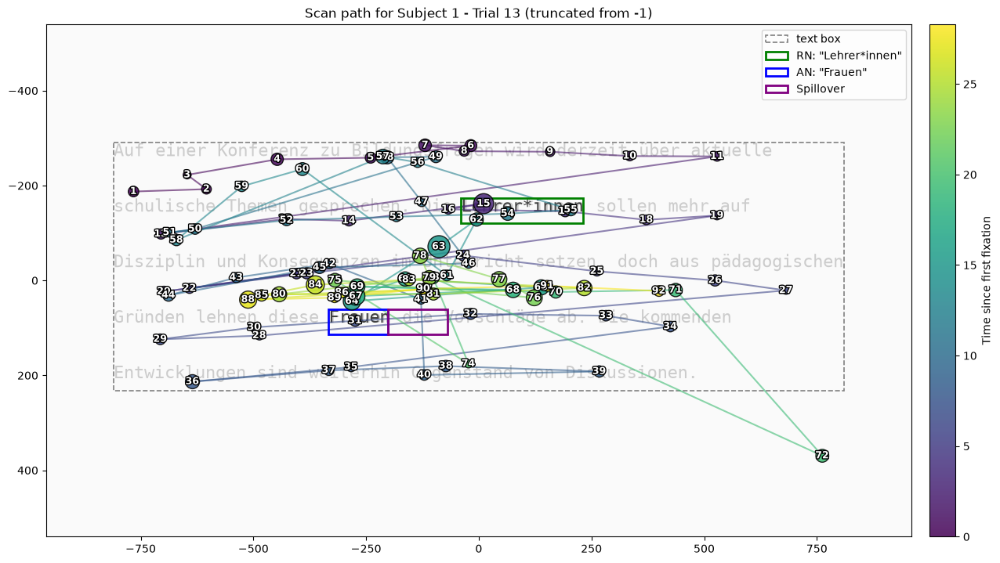

Lehrer*innen
letter width is: 22.5


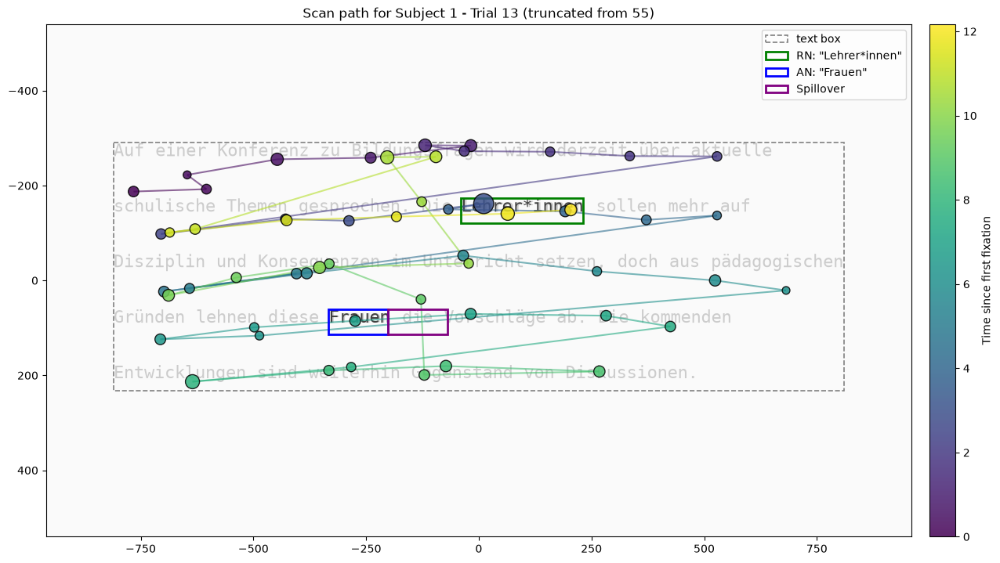

In [ ]:
plot_scanpath(events_data_selected, fixations_truncated, sentence_i=13, show_numbers=True)
plot_scanpath(events_data_selected, fixations_truncated, sentence_i=13, truncate_i=55)

Studenten
letter width is: 22.555555555555557


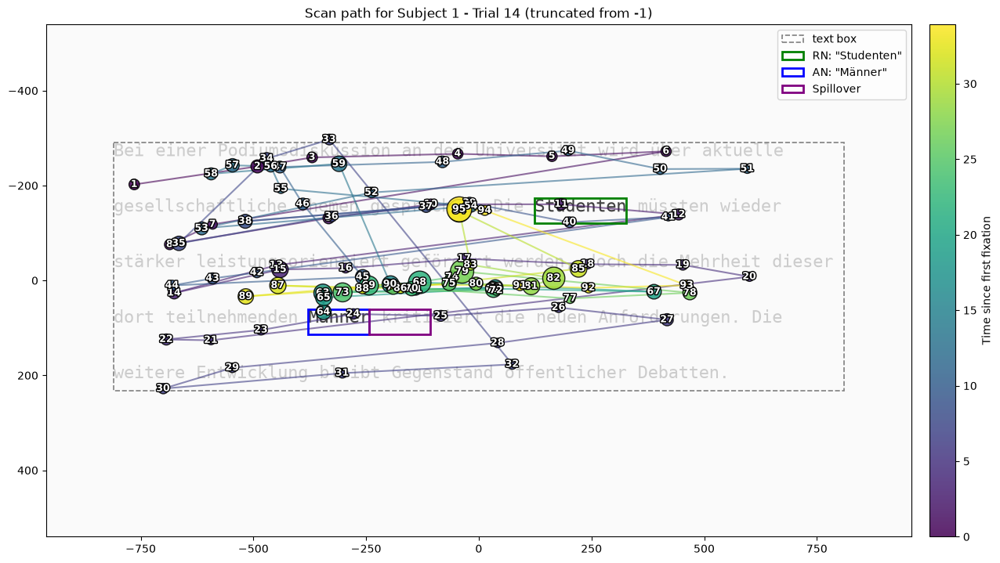

Studenten
letter width is: 22.555555555555557


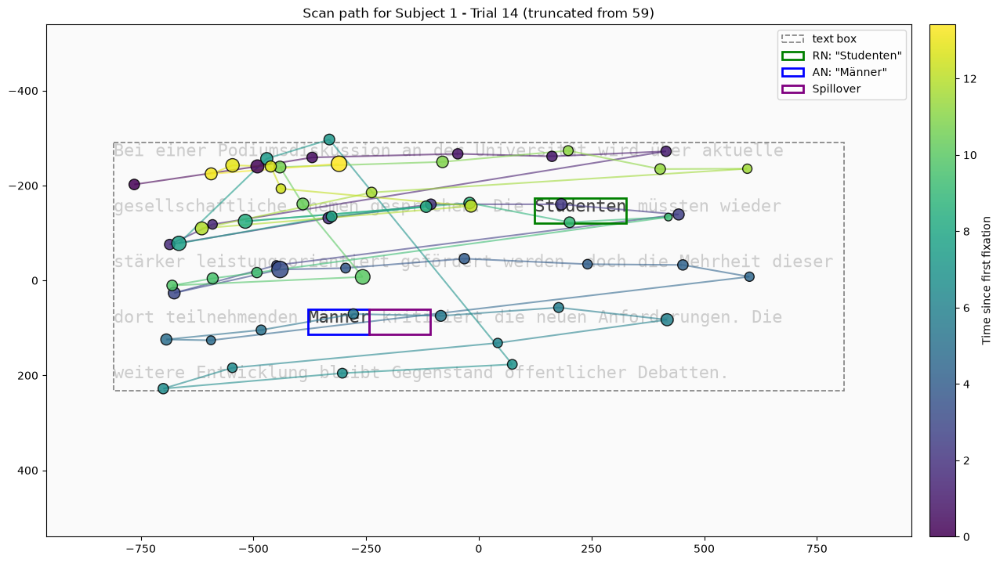

In [ ]:
plot_scanpath(events_data_selected, fixations_truncated, sentence_i=14, show_numbers=True)
plot_scanpath(events_data_selected, fixations_truncated, sentence_i=14, truncate_i=59)

Arbeitnehmer*innen
letter width is: 22.88888888888889


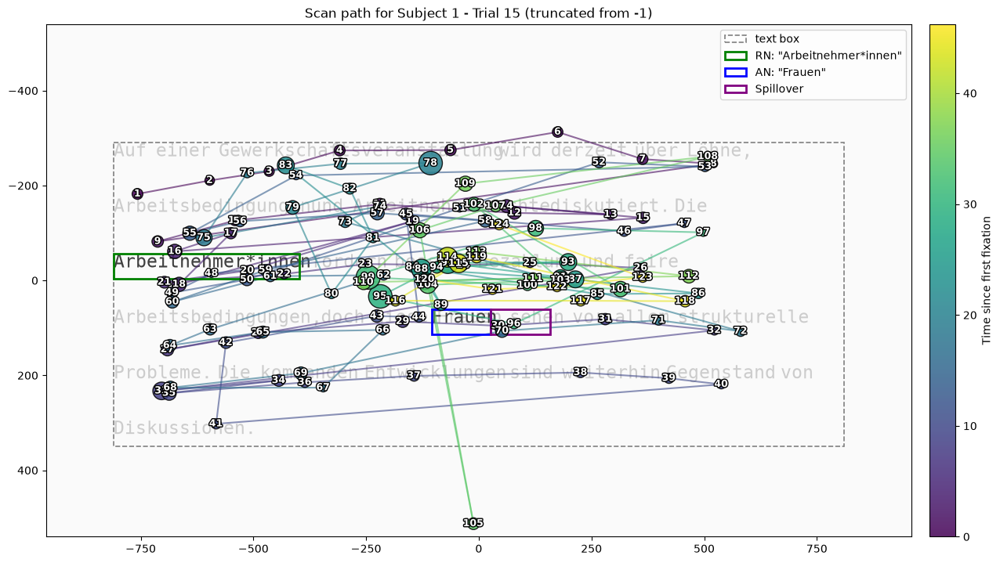

Arbeitnehmer*innen
letter width is: 22.88888888888889


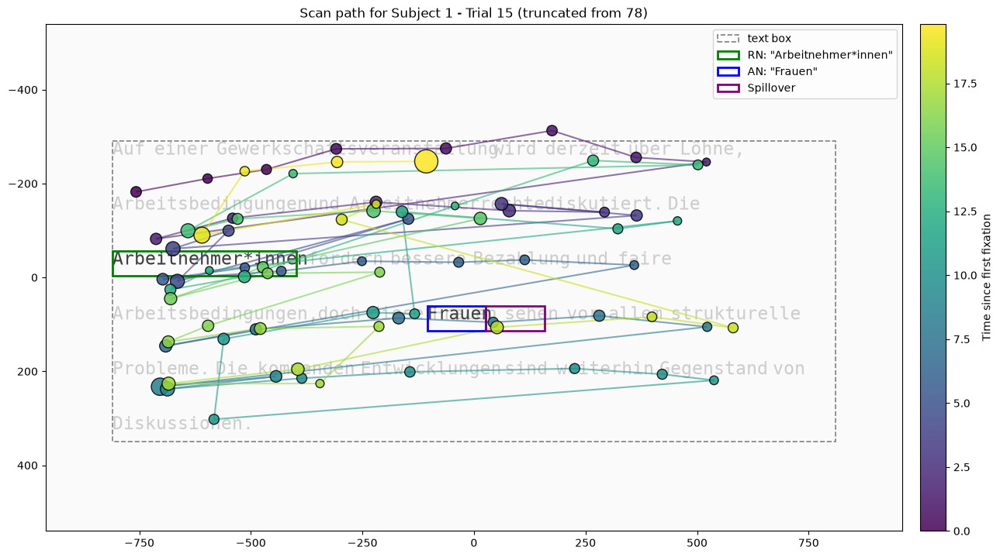

In [ ]:
plot_scanpath(events_data_selected, fixations_truncated, sentence_i=15, show_numbers=True)
plot_scanpath(events_data_selected, fixations_truncated, sentence_i=15, truncate_i=78)

Expertinnen
letter width is: 22.545454545454547


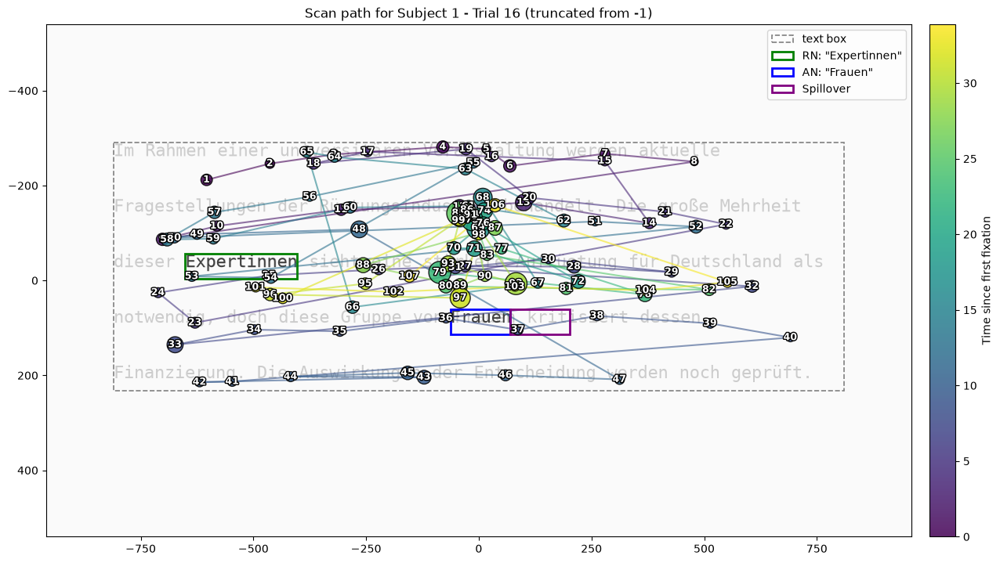

Expertinnen
letter width is: 22.545454545454547


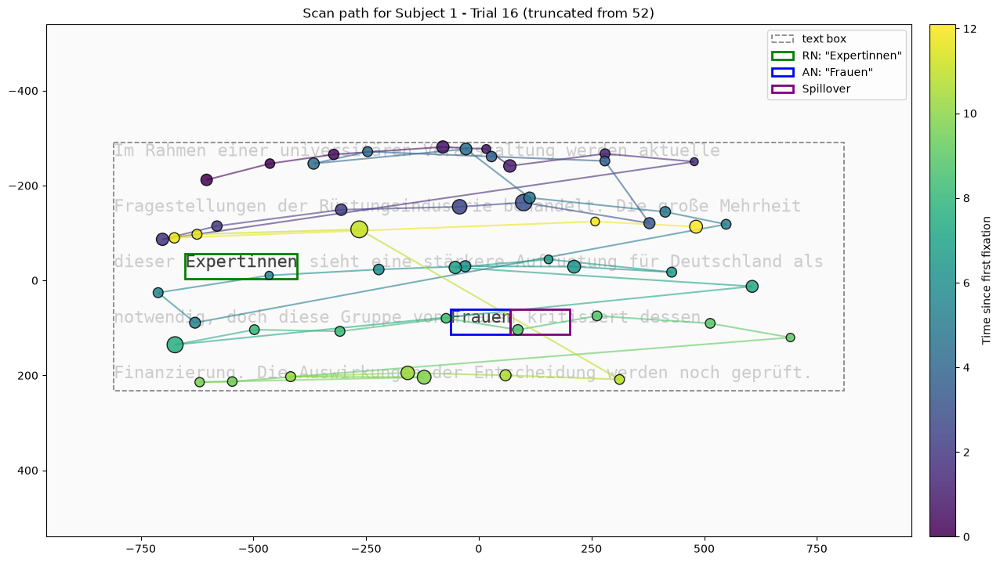

In [ ]:
plot_scanpath(events_data_selected, fixations_truncated, sentence_i=16, show_numbers=True)
plot_scanpath(events_data_selected, fixations_truncated, sentence_i=16, truncate_i=52)

Ingenieurinnen
letter width is: 22.571428571428573


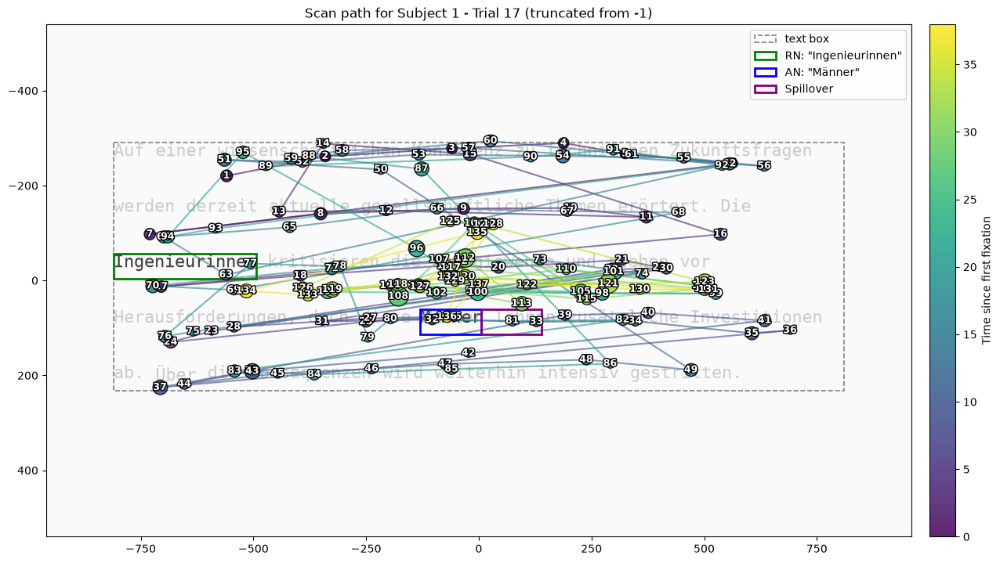

Ingenieurinnen
letter width is: 22.571428571428573


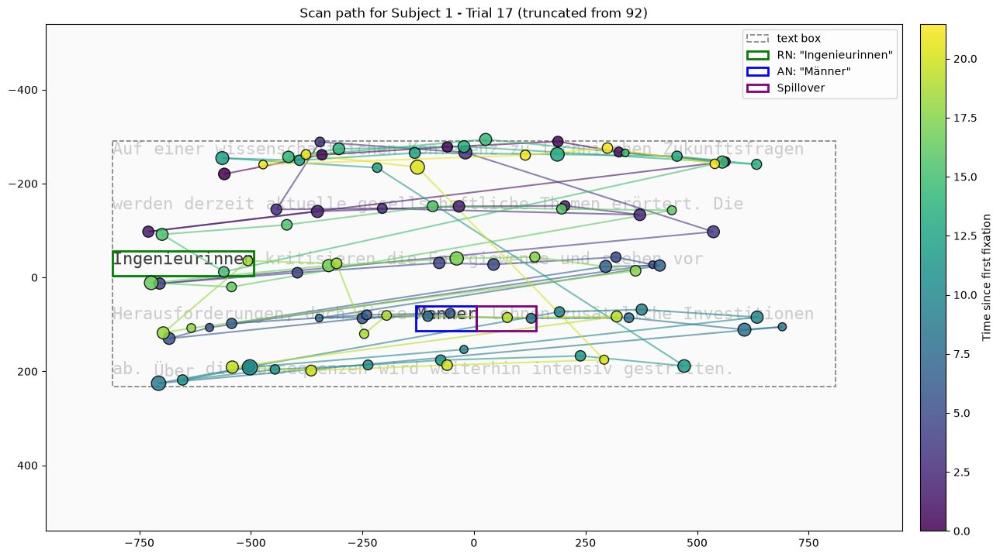

In [ ]:
plot_scanpath(events_data_selected, fixations_truncated, sentence_i=17, show_numbers=True)
plot_scanpath(events_data_selected, fixations_truncated, sentence_i=17, truncate_i=92)

In [863]:


# Force Matplotlib to rebuild its font cache
fm._load_fontmanager(try_read_cache=False)

font_path = '/Users/qianyueli/Documents/fonts/droid-sans-mono/DroidSansMono.ttf'
font_prop = fm.FontProperties(fname=font_path)

print("Font file path:", font_path)
print("Font name:", font_prop.get_name())

INFO:matplotlib.font_manager:Failed to extract font properties from /System/Library/PrivateFrameworks/FontServices.framework/Resources/Reserved/PingFangUI.ttc: FT_Open_Face (ft2font.cpp line 200) failed with error 0x90: locations (loca) table missing
INFO:matplotlib.font_manager:Failed to extract font properties from /System/Library/Fonts/LastResort.otf: tuple indices must be integers or slices, not str
INFO:matplotlib.font_manager:Failed to extract font properties from /System/Library/Fonts/Apple Color Emoji.ttc: Non-scalable fonts are not supported
INFO:matplotlib.font_manager:Failed to extract font properties from /System/Library/Fonts/Supplemental/NISC18030.ttf: Non-scalable fonts are not supported
INFO:matplotlib.font_manager:generated new fontManager


Font file path: /Users/qianyueli/Documents/fonts/droid-sans-mono/DroidSansMono.ttf
Font name: Droid Sans Mono


In [775]:
import pandas as pd
import ast
import eyekit

# 1. Load the generated CSV file
csv_path = f'../data/splitted_sentences/splitted_sentences_SUBJ{SUBJECT}.csv'
df = pd.read_csv(csv_path)

# 2. Parse stringified lists back into Python lists
df['Lines'] = df['Lines'].apply(ast.literal_eval)
df['y_top'] = df['y_top'].apply(ast.literal_eval)

# 3. Convert rows to eyekit.TextBlock objects
text_blocks = {}

for _, row in df.iterrows():
    sentence_id = row['Sentence_id']
    lines = row['Lines']
    y_tops = row['y_top']
    
    # Build the Eyekit TextBlock
    block = eyekit.TextBlock(
        text=lines,
        position=(TEXT_START_X + (1920/2), TEXT_START_Y + (1080/2) + FONT_SIZE),    #eyekit uses the baseline of the text not the top, fontsize is added to correct the offset   
        font_face='Droid Sans Mono',  # Must match your experiment's monospace font
        font_size=39,               # Match your rendered font size in pixels
        line_height=LINE_SPACE,
        align='left',
        anchor='left'
    )
    
    text_blocks[sentence_id] = block

In [776]:
# get the aoi recangles for eyekit (x, y, width, height) with coordinates adjusted
aoi = {}

for i, row in events_data_selected.iterrows():
    rn = (
        row['rn_x1'] + 1920/2, 
        row['rn_y1'] + 1080/2, 
        row['rn_x2']-row['rn_x1'], 
        row['rn_y2']-row['rn_y1']
    )
    an = (
        row['an_x1'] + 1920/2, 
        row['an_y1'] + 1080/2, 
        row['an_x2']-row['an_x1'], 
        row['an_y2']-row['an_y1']
    )
    spill = (
        row['spill_x1'] + 1920/2, 
        row['spill_y1'] + 1080/2, 
        row['spill_x2']-row['spill_x1'], 
        row['spill_y2']-row['spill_y1']
    )
    text_box = (
        row['text_start_x'] + 1920/2,
        row['text_start_y'] + 1080/2,
        row['box_width'],
        row['last_line_y'] - row['text_start_y'] + WORD_H
    )
    if i == 11:
        print(row['RN'])

    aoi[i] = {'rn': rn, 'an': an, 'spill': spill, 'text_box': text_box} 

<RN>Dozentinnen</RN>


In [828]:
sentence_id = 17

In [844]:


# Example DataFrame structure:
# fixations_df: ['start', 'duration', 'x_px_center', 'y_px_center', 'sentence_index']

# 1. Filter fixations for a specific sentence / trial

trial_fixations = fixations_truncated[(fixations_truncated['Sentence_i'] == sentence_id) & (fixations_truncated['keep']==True)]

# 2. Extract fixations into a list of tuples: (x, y, start_time, end_time)
# Note: end_time = start + duration
fixation_tuples = [
    (row['X_px_center']+(1920/2), row['Y_px_center']+(1080/2), row['Start'], row['Start'] + row['Duration'])
    for _, row in trial_fixations.iterrows()
]

# 3. Create the Eyekit FixationSequence object
seq = eyekit.FixationSequence(fixation_tuples)

# Print summary metrics (e.g., total fixations, total duration)
print(seq)

FixationSequence[Fixation[400,319], ..., Fixation[376,430]]


In [830]:

img = eyekit.vis.Image(1920, 1080)
img.draw_text_block(text_blocks[sentence_id])
img.draw_fixation_sequence(seq, color='blue')
img.draw_rectangle(aoi[sentence_id]['rn'], color='red')
img.draw_rectangle(aoi[sentence_id]['an'], color='red')
img.draw_rectangle(aoi[sentence_id]['spill'], color='red')
img.save(f'../plots/gazepath_subj{SUBJECT}-trial{sentence_id}.png')

In [845]:
corr_method = ['regress', 'stretch', 'chain', 'merge']   #split, stretch (and chain and regress render the same?) - strech works better when there are messy regressions, merge too? cluster too? and regress?
d, k = seq.snap_to_lines(text_blocks[sentence_id], method=corr_method)
print(f'delta: {d}, kappa:{k}')

img_corr = eyekit.vis.Image(1920, 1080)
img_corr.draw_text_block(text_blocks[sentence_id])
img_corr.draw_fixation_sequence(seq, color='blue')
img_corr.draw_rectangle(aoi[sentence_id]['rn'], color='red')
img_corr.draw_rectangle(aoi[sentence_id]['an'], color='red')
img_corr.draw_rectangle(aoi[sentence_id]['spill'], color='red')
img_corr.save(f'../plots/gazepath_subj{SUBJECT}-trial{sentence_id}(corr: {corr_method}).png')

delta: 15.838709677419354, kappa:0.9931581173787497


In [793]:
eyekit.tools.align_to_screenshot(text_blocks[sentence_id], '../plots/subj1_trial11_screenshot.png')

In [794]:
screenshot_path = "../plots/subj1_trial11_screenshot.png"

# Option 1: Pass image path directly as the background
viz = eyekit.vis.Image(1920, 1080)
viz.set_background_image(screenshot_path)

# Draw your manual AOIs directly onto the screenshot
viz.draw_rectangle(aoi[sentence_id]['rn'], color='red')
viz.draw_rectangle(aoi[sentence_id]['an'], color='red')
viz.draw_rectangle(aoi[sentence_id]['spill'], color='red')
viz.draw_rectangle(aoi[sentence_id]['text_box'], color='blue')

viz.save("overlay_check.png")